In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/vinbigdata-chest-xray-abnormalities-detection/sample_submission.csv
/kaggle/input/vinbigdata-chest-xray-abnormalities-detection/train.csv
/kaggle/input/vinbigdata-chest-xray-abnormalities-detection/test/83caa8a85e03606cf57e49147d7ac569.dicom
/kaggle/input/vinbigdata-chest-xray-abnormalities-detection/test/7550347fa2bb96c2354a3716dfa3a69c.dicom
/kaggle/input/vinbigdata-chest-xray-abnormalities-detection/test/74b23792db329cff5843e36efb8aa65a.dicom
/kaggle/input/vinbigdata-chest-xray-abnormalities-detection/test/94568a546be103177cb582d3e91cd2d8.dicom
/kaggle/input/vinbigdata-chest-xray-abnormalities-detection/test/6da36354fc904b63bc03eb3884e0c35c.dicom
/kaggle/input/vinbigdata-chest-xray-abnormalities-detection/test/5b3620a56668010877cfafa9322e18b5.dicom
/kaggle/input/vinbigdata-chest-xray-abnormalities-detection/test/5157d5c9b1f0004b29310652ea54e825.dicom
/kaggle/input/vinbigdata-chest-xray-abnormalities-detection/test/74897408dcbd69ef7c76cbbbbeb722d6.dicom
/kaggle/input/vi

In [2]:
import numpy as np
import pandas as pd
import os


In [3]:
# List dataset files
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))


/kaggle/input/vinbigdata-chest-xray-abnormalities-detection/sample_submission.csv
/kaggle/input/vinbigdata-chest-xray-abnormalities-detection/train.csv
/kaggle/input/vinbigdata-chest-xray-abnormalities-detection/test/83caa8a85e03606cf57e49147d7ac569.dicom
/kaggle/input/vinbigdata-chest-xray-abnormalities-detection/test/7550347fa2bb96c2354a3716dfa3a69c.dicom
/kaggle/input/vinbigdata-chest-xray-abnormalities-detection/test/74b23792db329cff5843e36efb8aa65a.dicom
/kaggle/input/vinbigdata-chest-xray-abnormalities-detection/test/94568a546be103177cb582d3e91cd2d8.dicom
/kaggle/input/vinbigdata-chest-xray-abnormalities-detection/test/6da36354fc904b63bc03eb3884e0c35c.dicom
/kaggle/input/vinbigdata-chest-xray-abnormalities-detection/test/5b3620a56668010877cfafa9322e18b5.dicom
/kaggle/input/vinbigdata-chest-xray-abnormalities-detection/test/5157d5c9b1f0004b29310652ea54e825.dicom
/kaggle/input/vinbigdata-chest-xray-abnormalities-detection/test/74897408dcbd69ef7c76cbbbbeb722d6.dicom
/kaggle/input/vi

In [4]:
base = "/kaggle/input/vinbigdata-chest-xray-abnormalities-detection/"

file_path = base + "train.csv"
size_mb = os.path.getsize(file_path) / (1024 * 1024)

print(f"train.csv size: {size_mb:.2f} MB")


train.csv size: 4.44 MB


In [5]:
df_train = pd.read_csv(base + "train.csv")
df_sample = pd.read_csv(base + "sample_submission.csv")

print("Train shape:", df_train.shape)
df_train.head()


Train shape: (67914, 8)


/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()


,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max
0,50a418190bc3fb1ef1633bf9678929b3,No finding,14,R11,NaN,NaN,NaN,NaN
1,21a10246a5ec7af151081d0cd6d65dc9,No finding,14,R7,NaN,NaN,NaN,NaN
2,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,691.0,1375.0,1653.0,1831.0
3,051132a778e61a86eb147c7c6f564dfe,Aortic enlargement,0,R10,1264.0,743.0,1611.0,1019.0
4,063319de25ce7edb9b1c6b8881290140,No finding,14,R10,NaN,NaN,NaN,NaN


In [6]:
print("Columns:", df_train.columns)
df_train.info()


Columns: Index(['image_id', 'class_name', 'class_id', 'rad_id', 'x_min', 'y_min',
       'x_max', 'y_max'],
      dtype='object')
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67914 entries, 0 to 67913
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image_id    67914 non-null  object 
 1   class_name  67914 non-null  object 
 2   class_id    67914 non-null  int64  
 3   rad_id      67914 non-null  object 
 4   x_min       36096 non-null  float64
 5   y_min       36096 non-null  float64
 6   x_max       36096 non-null  float64
 7   y_max       36096 non-null  float64
dtypes: float64(4), int64(1), object(3)
memory usage: 4.1+ MB


In [7]:
df_train.describe(include="all")


/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()


,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max
count,67914,67914,67914.000000,67914,36096.000000,36096.000000,36096.000000,36096.000000
unique,15000,15,NaN,17,NaN,NaN,NaN,NaN
top,03e6ecfa6f6fb33dfeac6ca4f9b459c9,No finding,NaN,R9,NaN,NaN,NaN,NaN
freq,57,31818,NaN,15708,NaN,NaN,NaN,NaN
mean,NaN,NaN,9.979312,NaN,1051.332696,1065.262051,1492.269337,1456.660489
std,NaN,NaN,5.036494,NaN,565.838078,552.925133,595.384126,581.134138
min,NaN,NaN,0.000000,NaN,0.000000,0.000000,68.000000,103.000000
25%,NaN,NaN,7.000000,NaN,602.000000,627.000000,1010.000000,1009.000000
50%,NaN,NaN,13.000000,NaN,1014.500000,935.000000,1567.000000,1411.000000
75%,NaN,NaN,14.000000,NaN,1457.000000,1471.000000,1947.000000,1911.000000


In [8]:
df_train['class_name'].value_counts()


class_name
No finding            31818
Aortic enlargement     7162
Cardiomegaly           5427
Pleural thickening     4842
Pulmonary fibrosis     4655
Nodule/Mass            2580
Lung Opacity           2483
Pleural effusion       2476
Other lesion           2203
Infiltration           1247
ILD                    1000
Calcification           960
Consolidation           556
Atelectasis             279
Pneumothorax            226
Name: count, dtype: int64

In [9]:
print("No Finding images:",
      (df_train['class_name'] == "No finding").sum())


No Finding images: 31818


In [10]:
print("Unique images:", df_train['image_id'].nunique())


Unique images: 15000


In [11]:
df_train.isna().sum()


image_id          0
class_name        0
class_id          0
rad_id            0
x_min         31818
y_min         31818
x_max         31818
y_max         31818
dtype: int64

In [12]:
BASE_PATH = "/kaggle/input/vinbigdata-chest-xray-abnormalities-detection/"
TRAIN_IMG_DIR = BASE_PATH + "train/"

OUTPUT_DIR = "/kaggle/working/preprocessed_images"

IMG_SIZE = 512
MAX_IMAGES = 1500

os.makedirs(OUTPUT_DIR, exist_ok=True)


In [13]:
df_train = pd.read_csv(BASE_PATH + "train.csv")
print("Total rows:", df_train.shape)
print("Unique images:", df_train['image_id'].nunique())


Total rows: (67914, 8)
Unique images: 15000


In [14]:
dicom_files = os.listdir(TRAIN_IMG_DIR)
dicom_files = dicom_files[:MAX_IMAGES]

print("Images selected:", len(dicom_files))


Images selected: 1500


In [15]:
import pydicom
import cv2

def load_dicom_image(path):
    dcm = pydicom.dcmread(path)
    img = dcm.pixel_array.astype(np.float32)

    # Min-Max normalization
    img = (img - img.min()) / (img.max() - img.min() + 1e-7)
    img = (img * 255).astype(np.uint8)

    return img


In [16]:
def normalize_image(img, method="minmax"):
    img = img.astype(np.float32)

    if method == "minmax":
        img = (img - img.min()) / (img.max() - img.min() + 1e-7)

    elif method == "zscore":
        img = (img - img.mean()) / (img.std() + 1e-7)

    return img


In [17]:
def apply_clahe(img):
    img = (img * 255).astype(np.uint8)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    return clahe.apply(img)


In [18]:
def denoise_image(img):
    img = cv2.GaussianBlur(img, (3,3), 0)
    img = cv2.medianBlur(img, 3)
    return img


In [19]:
def crop_and_pad(img, size=IMG_SIZE):
    _, thresh = cv2.threshold(img, 5, 255, cv2.THRESH_BINARY)
    coords = cv2.findNonZero(thresh)

    if coords is not None:
        x, y, w, h = cv2.boundingRect(coords)
        img = img[y:y+h, x:x+w]

    h, w = img.shape
    diff = abs(h - w)

    if h < w:
        pad = diff // 2
        img = cv2.copyMakeBorder(img, pad, pad, 0, 0, cv2.BORDER_CONSTANT)
    else:
        pad = diff // 2
        img = cv2.copyMakeBorder(img, 0, 0, pad, pad, cv2.BORDER_CONSTANT)

    img = cv2.resize(img, (size, size))
    return img


In [20]:
def preprocess_image(dicom_path):
    img = load_dicom_image(dicom_path)
    img = normalize_image(img, "minmax")
    img = apply_clahe(img)
    img = denoise_image(img)
    img = crop_and_pad(img)
    return img


In [21]:
from tqdm import tqdm

for file in tqdm(dicom_files):
    dicom_path = os.path.join(TRAIN_IMG_DIR, file)

    # preprocess
    img = preprocess_image(dicom_path)

    # SAFE filename handling
    filename = os.path.splitext(file)[0] + ".png"
    save_path = os.path.join(OUTPUT_DIR, filename)

    # Ensure uint8 before saving
    if img.dtype != np.uint8:
        img = (img * 255).astype(np.uint8)

    cv2.imwrite(save_path, img)


100%|██████████| 1500/1500 [28:24<00:00,  1.14s/it]


In [22]:
import os
import pandas as pd
import numpy as np
from tqdm import tqdm


In [23]:
import os
import pandas as pd

BASE_PATH = "/kaggle/input/vinbigdata-chest-xray-abnormalities-detection/"
TRAIN_CSV = BASE_PATH + "train.csv"

print("CSV path:", TRAIN_CSV)


CSV path: /kaggle/input/vinbigdata-chest-xray-abnormalities-detection/train.csv


In [24]:
import pandas as pd

df = pd.read_csv(TRAIN_CSV)
print("Total rows in train.csv:", df.shape)
df.head()


Total rows in train.csv: (67914, 8)


/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()


,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max
0,50a418190bc3fb1ef1633bf9678929b3,No finding,14,R11,NaN,NaN,NaN,NaN
1,21a10246a5ec7af151081d0cd6d65dc9,No finding,14,R7,NaN,NaN,NaN,NaN
2,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,691.0,1375.0,1653.0,1831.0
3,051132a778e61a86eb147c7c6f564dfe,Aortic enlargement,0,R10,1264.0,743.0,1611.0,1019.0
4,063319de25ce7edb9b1c6b8881290140,No finding,14,R10,NaN,NaN,NaN,NaN


In [25]:
import os

IMAGE_DIR = "/kaggle/working/preprocessed_images"

processed_images = os.listdir(IMAGE_DIR)
image_ids = [os.path.splitext(f)[0] for f in processed_images]

print("Total processed images:", len(image_ids))


Total processed images: 1500


In [26]:
df_1500 = df[df["image_id"].isin(image_ids)]
print("Filtered rows:", df_1500.shape)


Filtered rows: (6809, 8)


In [27]:
IMG_SIZE = 512  # MUST match preprocessing size

def convert_to_yolo(row):
    x_center = ((row.x_min + row.x_max) / 2) / IMG_SIZE
    y_center = ((row.y_min + row.y_max) / 2) / IMG_SIZE
    width = (row.x_max - row.x_min) / IMG_SIZE
    height = (row.y_max - row.y_min) / IMG_SIZE

    return f"{int(row.class_id)} {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}"


In [28]:
LABEL_DIR = "/kaggle/working/labels"
os.makedirs(LABEL_DIR, exist_ok=True)

from tqdm import tqdm

for image_id in tqdm(image_ids):
    rows = df_1500[df_1500["image_id"] == image_id]

    # Skip "No finding"
    if rows.empty or rows.iloc[0]["class_name"] == "No finding":
        continue

    label_path = os.path.join(LABEL_DIR, image_id + ".txt")

    with open(label_path, "w") as f:
        for _, row in rows.iterrows():
            f.write(convert_to_yolo(row) + "\n")


100%|██████████| 1500/1500 [00:01<00:00, 915.92it/s]


In [29]:
print("Total label files created:", len(os.listdir(LABEL_DIR)))
print("Sample label file:", os.listdir(LABEL_DIR)[:1])


Total label files created: 435
Sample label file: ['fa9cd1a78a6d2d8d6e918a8c4125faf4.txt']


In [30]:
sample = os.listdir(LABEL_DIR)[0]
with open(os.path.join(LABEL_DIR, sample)) as f:
    print(f.read())


1 1.625000 1.847656 1.187500 1.746094
7 1.690430 1.781250 1.009766 1.625000
7 1.611328 1.427734 1.238281 1.035156
4 1.845703 2.028320 0.578125 0.927734
7 1.845703 2.028320 0.578125 0.927734
4 1.690430 1.781250 1.009766 1.625000
8 1.845703 2.028320 0.578125 0.927734
4 1.625000 1.847656 1.187500 1.746094
8 1.690430 1.781250 1.009766 1.625000



In [31]:
import os
import random
import shutil


In [32]:
IMAGE_DIR = "/kaggle/working/preprocessed_images"
LABEL_DIR = "/kaggle/working/labels"

OUTPUT_BASE = "/kaggle/working/yolo_dataset"

TRAIN_RATIO = 0.7
VAL_RATIO = 0.2
TEST_RATIO = 0.1


In [33]:
for split in ["train", "val", "test"]:
    os.makedirs(f"{OUTPUT_BASE}/images/{split}", exist_ok=True)
    os.makedirs(f"{OUTPUT_BASE}/labels/{split}", exist_ok=True)


In [34]:
images = [f for f in os.listdir(IMAGE_DIR) if f.endswith(".png")]
print("Total images:", len(images))


Total images: 1500


In [35]:
random.shuffle(images)

total = len(images)
train_end = int(total * TRAIN_RATIO)
val_end = train_end + int(total * VAL_RATIO)

train_images = images[:train_end]
val_images = images[train_end:val_end]
test_images = images[val_end:]

print("Train:", len(train_images))
print("Val:", len(val_images))
print("Test:", len(test_images))


Train: 1050
Val: 300
Test: 150


In [36]:
def copy_files(image_list, split):
    for img in image_list:
        # copy image
        src_img = os.path.join(IMAGE_DIR, img)
        dst_img = os.path.join(OUTPUT_BASE, "images", split, img)
        shutil.copy(src_img, dst_img)

        # copy label if exists
        label_name = img.replace(".png", ".txt")
        src_label = os.path.join(LABEL_DIR, label_name)
        dst_label = os.path.join(OUTPUT_BASE, "labels", split, label_name)

        if os.path.exists(src_label):
            shutil.copy(src_label, dst_label)


In [37]:
copy_files(train_images, "train")
copy_files(val_images, "val")
copy_files(test_images, "test")


In [38]:
print("Train images:", len(os.listdir(f"{OUTPUT_BASE}/images/train")))
print("Val images:", len(os.listdir(f"{OUTPUT_BASE}/images/val")))
print("Test images:", len(os.listdir(f"{OUTPUT_BASE}/images/test")))

print("Train labels:", len(os.listdir(f"{OUTPUT_BASE}/labels/train")))
print("Val labels:", len(os.listdir(f"{OUTPUT_BASE}/labels/val")))
print("Test labels:", len(os.listdir(f"{OUTPUT_BASE}/labels/test")))


Train images: 1050
Val images: 300
Test images: 150
Train labels: 300
Val labels: 87
Test labels: 48


In [39]:
data_yaml = """
path: /kaggle/working/yolo_dataset

train: images/train
val: images/val
test: images/test

nc: 14

names:
  0: Aortic enlargement
  1: Atelectasis
  2: Calcification
  3: Cardiomegaly
  4: Consolidation
  5: ILD
  6: Infiltration
  7: Lung Opacity
  8: Nodule/Mass
  9: Other lesion
  10: Pleural effusion
  11: Pleural thickening
  12: Pneumothorax
  13: Pulmonary fibrosis
"""


In [40]:
with open("/kaggle/working/data.yaml", "w") as f:
    f.write(data_yaml)

print("data.yaml created successfully")


data.yaml created successfully


In [41]:
!pip install -q ultralytics


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 21.0 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.8/16.8 MB 42.1 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 5.0 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 57.1 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 73.3 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 18.4 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 2.1 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 34.0 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 14.3 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [42]:
from ultralytics import YOLO


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [43]:
model = YOLO("yolov8n.pt")  # nano model


In [44]:
results = model.train(
    data="/kaggle/working/data.yaml",
    epochs=50,
    imgsz=512,
    batch=8,
    device=0,      # GPU
    workers=2,
    project="CliniScan",
    name="yolov8_lung_detection",
    patience=10
)


Ultralytics 8.3.239 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=512, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolov8_lung_detection, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=10, perspective=0.0, plots=True

/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       2/50     0.857G          0      34.89          0          0        512: 100% ━━━━━━━━━━━━ 94/94 15.8it/s 6.0s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 14/14 21.2it/s 0.7s0.2s
                   all        213          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       3/50     0.875G          0      32.28          0          0        512: 100% ━━━━━━━━━━━━ 94/94 16.5it/s 5.7s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 14/14 21.8it/s 0.6s0.2s
                   all        213          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       4/50     0.893G          0       29.6          0          0        512: 100% ━━━━━━━━━━━━ 94/94 16.3it/s 5.8s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 14/14 20.8it/s 0.7s0.2s
                   all        213          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       5/50     0.908G          0      26.83          0          0        512: 100% ━━━━━━━━━━━━ 94/94 15.9it/s 5.9s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 14/14 21.5it/s 0.7s0.2s
                   all        213          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       6/50     0.926G          0      24.17          0          0        512: 100% ━━━━━━━━━━━━ 94/94 16.8it/s 5.6s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 14/14 19.3it/s 0.7s0.1s
                   all        213          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       7/50     0.943G          0      21.63          0          0        512: 100% ━━━━━━━━━━━━ 94/94 15.7it/s 6.0s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 14/14 27.4it/s 0.5s0.1s
                   all        213          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       8/50     0.961G          0      19.29          0          0        512: 100% ━━━━━━━━━━━━ 94/94 16.1it/s 5.8s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 14/14 22.3it/s 0.6s0.2s
                   all        213          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       9/50     0.977G          0      17.21          0          0        512: 100% ━━━━━━━━━━━━ 94/94 15.7it/s 6.0s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 14/14 24.8it/s 0.6s0.1s
                   all        213          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      10/50     0.994G          0      15.26          0          0        512: 100% ━━━━━━━━━━━━ 94/94 15.9it/s 5.9s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 14/14 25.3it/s 0.6s0.1s
                   all        213          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      11/50      1.01G          0      13.51          0          0        512: 100% ━━━━━━━━━━━━ 94/94 15.9it/s 5.9s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 14/14 27.1it/s 0.5s0.1s
                   all        213          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      12/50      1.03G          0      11.94          0          0        512: 100% ━━━━━━━━━━━━ 94/94 17.0it/s 5.5s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 14/14 22.8it/s 0.6s0.1s
                   all        213          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      13/50      1.04G          0      10.55          0          0        512: 100% ━━━━━━━━━━━━ 94/94 16.3it/s 5.8s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 14/14 23.0it/s 0.6s0.1s
                   all        213          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      14/50      1.06G          0      9.317          0          0        512: 100% ━━━━━━━━━━━━ 94/94 15.6it/s 6.0s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 14/14 27.5it/s 0.5s0.1s
                   all        213          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      15/50      1.08G          0      8.226          0          0        512: 100% ━━━━━━━━━━━━ 94/94 16.4it/s 5.7s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 14/14 23.2it/s 0.6s0.1s
                   all        213          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      16/50       1.1G          0      7.266          0          0        512: 100% ━━━━━━━━━━━━ 94/94 16.3it/s 5.8s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 14/14 22.0it/s 0.6s0.1s
                   all        213          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      17/50      1.11G          0      6.432          0          0        512: 100% ━━━━━━━━━━━━ 94/94 16.6it/s 5.7s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 14/14 25.8it/s 0.5s0.1s
                   all        213          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      18/50      1.13G          0      5.694          0          0        512: 100% ━━━━━━━━━━━━ 94/94 16.5it/s 5.7s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 14/14 22.9it/s 0.6s0.2s
                   all        213          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      19/50      1.15G          0      5.057          0          0        512: 100% ━━━━━━━━━━━━ 94/94 16.2it/s 5.8s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 14/14 21.8it/s 0.6s0.2s
                   all        213          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      20/50      1.17G          0      4.501          0          0        512: 100% ━━━━━━━━━━━━ 94/94 15.9it/s 5.9s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 14/14 25.3it/s 0.6s0.1s
                   all        213          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      21/50      1.18G          0      4.024          0          0        512: 100% ━━━━━━━━━━━━ 94/94 16.5it/s 5.7s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 14/14 21.5it/s 0.7s0.1s
                   all        213          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      22/50       1.2G          0      3.598          0          0        512: 100% ━━━━━━━━━━━━ 94/94 16.1it/s 5.8s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 14/14 24.8it/s 0.6s0.2s
                   all        213          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      23/50      1.22G          0      3.215          0          0        512: 100% ━━━━━━━━━━━━ 94/94 15.6it/s 6.0s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 14/14 28.1it/s 0.5s0.1s
                   all        213          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      24/50      1.23G          0       2.89          0          0        512: 100% ━━━━━━━━━━━━ 94/94 16.3it/s 5.8s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 14/14 25.0it/s 0.6s0.1s
                   all        213          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      25/50      1.25G          0      2.579          0          0        512: 100% ━━━━━━━━━━━━ 94/94 16.0it/s 5.9s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 14/14 23.9it/s 0.6s0.2s
                   all        213          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      26/50      1.27G          0       2.34          0          0        512: 100% ━━━━━━━━━━━━ 94/94 15.9it/s 5.9s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 14/14 27.8it/s 0.5s0.1s
                   all        213          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      27/50      1.29G          0      2.119          0          0        512: 100% ━━━━━━━━━━━━ 94/94 16.4it/s 5.7s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 14/14 23.6it/s 0.6s0.2s
                   all        213          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      28/50       1.3G          0      1.887          0          0        512: 100% ━━━━━━━━━━━━ 94/94 16.0it/s 5.9s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 14/14 25.9it/s 0.5s0.1s
                   all        213          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      29/50      1.32G          0      1.716          0          0        512: 100% ━━━━━━━━━━━━ 94/94 16.0it/s 5.9s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 14/14 27.2it/s 0.5s0.1s
                   all        213          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      30/50      1.34G          0       1.58          0          0        512: 100% ━━━━━━━━━━━━ 94/94 16.5it/s 5.7s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 14/14 23.0it/s 0.6s0.1s
                   all        213          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      31/50      1.35G          0      1.453          0          0        512: 100% ━━━━━━━━━━━━ 94/94 16.6it/s 5.7s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 14/14 24.1it/s 0.6s0.2s
                   all        213          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      32/50      1.37G          0      1.345          0          0        512: 100% ━━━━━━━━━━━━ 94/94 16.0it/s 5.9s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 14/14 28.0it/s 0.5s0.1s
                   all        213          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      33/50      1.39G          0      1.228          0          0        512: 100% ━━━━━━━━━━━━ 94/94 16.6it/s 5.6s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 14/14 26.0it/s 0.5s0.1s
                   all        213          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      34/50       1.4G          0      1.112          0          0        512: 100% ━━━━━━━━━━━━ 94/94 16.2it/s 5.8s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 14/14 26.1it/s 0.5s0.1s
                   all        213          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      35/50      1.42G          0      1.023          0          0        512: 100% ━━━━━━━━━━━━ 94/94 15.6it/s 6.0s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 14/14 28.1it/s 0.5s0.1s
                   all        213          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      36/50      1.44G          0     0.9546          0          0        512: 100% ━━━━━━━━━━━━ 94/94 16.8it/s 5.6s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 14/14 21.3it/s 0.7s0.1s
                   all        213          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      37/50      1.46G          0     0.8869          0          0        512: 100% ━━━━━━━━━━━━ 94/94 15.7it/s 6.0s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 14/14 26.9it/s 0.5s0.1s
                   all        213          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      38/50      1.47G          0     0.8319          0          0        512: 100% ━━━━━━━━━━━━ 94/94 16.4it/s 5.7s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 14/14 25.6it/s 0.5s0.1s
                   all        213          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      39/50      1.49G          0     0.7883          0          0        512: 100% ━━━━━━━━━━━━ 94/94 15.7it/s 6.0s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 14/14 28.1it/s 0.5s0.1s
                   all        213          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      40/50      1.51G          0     0.7571          0          0        512: 100% ━━━━━━━━━━━━ 94/94 16.3it/s 5.8s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 14/14 27.7it/s 0.5s0.1s
                   all        213          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      41/50      1.52G          0     0.7338          0          0        512: 100% ━━━━━━━━━━━━ 94/94 14.9it/s 6.3s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 14/14 28.0it/s 0.5s0.1s
                   all        213          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      42/50      1.54G          0     0.7099          0          0        512: 100% ━━━━━━━━━━━━ 94/94 16.1it/s 5.8s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 14/14 27.2it/s 0.5s0.1s
                   all        213          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      43/50      1.56G          0     0.6884          0          0        512: 100% ━━━━━━━━━━━━ 94/94 15.9it/s 5.9s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 14/14 28.0it/s 0.5s0.1s
                   all        213          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      44/50      1.57G          0     0.6709          0          0        512: 100% ━━━━━━━━━━━━ 94/94 16.6it/s 5.7s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 14/14 27.1it/s 0.5s0.1s
                   all        213          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      45/50      1.59G          0     0.6578          0          0        512: 100% ━━━━━━━━━━━━ 94/94 16.2it/s 5.8s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 14/14 27.8it/s 0.5s0.1s
                   all        213          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      46/50      1.61G          0     0.6486          0          0        512: 100% ━━━━━━━━━━━━ 94/94 15.9it/s 5.9s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 14/14 27.5it/s 0.5s0.1s
                   all        213          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      47/50      1.63G          0     0.6399          0          0        512: 100% ━━━━━━━━━━━━ 94/94 16.3it/s 5.8s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 14/14 27.3it/s 0.5s0.1s
                   all        213          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      48/50      1.64G          0      0.632          0          0        512: 100% ━━━━━━━━━━━━ 94/94 17.0it/s 5.5s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 14/14 28.0it/s 0.5s0.1s
                   all        213          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      49/50      1.66G          0     0.6266          0          0        512: 100% ━━━━━━━━━━━━ 94/94 15.8it/s 5.9s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 14/14 27.4it/s 0.5s0.1s
                   all        213          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      50/50      1.68G          0     0.6228          0          0        512: 100% ━━━━━━━━━━━━ 94/94 15.5it/s 6.1s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 14/14 27.6it/s 0.5s0.1s
                   all        213          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



50 epochs completed in 0.093 hours.
Optimizer stripped from /kaggle/working/CliniScan/yolov8_lung_detection/weights/last.pt, 6.2MB
Optimizer stripped from /kaggle/working/CliniScan/yolov8_lung_detection/weights/best.pt, 6.2MB

Validating /kaggle/working/CliniScan/yolov8_lung_detection/weights/best.pt...
Ultralytics 8.3.239 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,008,378 parameters, 0 gradients, 8.1 GFLOPs
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 14/14 12.8it/s 1.1s0.3s


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:653: RuntimeWarning: Mean of empty slice.
  ax.plot(px, py.mean(1), linewidth=3, color="blue", label=f"all classes {ap[:, 0].mean():.3f} mAP@0.5")
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:697: RuntimeWarning: Mean of empty slice.
  y = smooth(py.mean(0), 0.1)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide
/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:697: RuntimeWarning: Mean of empty slice.
  y = smooth(py.mean(0), 0.1)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide
/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:697: RuntimeWarning: Mean of empty slice.
  y = smooth(py.mean(0),

                   all        213          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels
Speed: 0.2ms preprocess, 2.3ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to /kaggle/working/CliniScan/yolov8_lung_detection


In [45]:
model.val()


Ultralytics 8.3.239 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,008,378 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2787.0±462.5 MB/s, size: 138.1 KB)
val: Scanning /kaggle/working/yolo_dataset/labels/val.cache... 87 images, 213 backgrounds, 87 corrupt: 100% ━━━━━━━━━━━━ 300/300 593.0Kit/s 0.0s
val: /kaggle/working/yolo_dataset/images/val/051c2436c0acdb5e09d085c7e4a764f3.png: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     3.0859      3.3965      2.1953      2.4346      3.1094      2.2031      3.0732      1.6787      2.5947      2.5186       2.748      3.0596      3.4189      2.1504      3.0957      3.5127      2.2695      3.0801      1.5762      3.1377      1.5498]
val: /kaggle/working/yolo_dataset/images/val/0777120fdd60f6a3cf8eaf3b8cf3585a.png: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     2.7832       2.249      2.7744   

/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:653: RuntimeWarning: Mean of empty slice.
  ax.plot(px, py.mean(1), linewidth=3, color="blue", label=f"all classes {ap[:, 0].mean():.3f} mAP@0.5")
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:697: RuntimeWarning: Mean of empty slice.
  y = smooth(py.mean(0), 0.1)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide
/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:697: RuntimeWarning: Mean of empty slice.
  y = smooth(py.mean(0), 0.1)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide
/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:697: RuntimeWarning: Mean of empty slice.
  y = smooth(py.mean(0),

                   all        213          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels
Speed: 2.4ms preprocess, 3.9ms inference, 0.0ms loss, 0.6ms postprocess per image
Results saved to /kaggle/working/runs/detect/val


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([], dtype=int64)
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7ebc0c65b190>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
        

In [46]:
import os
import cv2
import pydicom
import numpy as np
import pandas as pd
from tqdm import tqdm
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision import models, transforms


In [47]:
BASE = "/kaggle/input/vinbigdata-chest-xray-abnormalities-detection/"
DICOM_DIR = BASE + "train/"
CSV_PATH = BASE + "train.csv"

OUT_DIR = "/kaggle/working/classification_1500/"
IMG_DIR = OUT_DIR + "images/"
os.makedirs(IMG_DIR, exist_ok=True)


In [48]:
df = pd.read_csv(CSV_PATH)

# Select first 1500 unique images
image_ids = df['image_id'].unique()[:1500]
df = df[df['image_id'].isin(image_ids)]

print("Total selected images:", len(image_ids))


Total selected images: 1500


In [49]:
def load_dicom(path):
    d = pydicom.dcmread(path)
    img = d.pixel_array.astype(np.float32)
    return img


In [50]:
def minmax_normalize(img):
    img = (img - img.min()) / (img.max() - img.min() + 1e-8)
    return (img * 255).astype(np.uint8)


In [51]:
def apply_clahe(img):
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    return clahe.apply(img)


In [52]:
def denoise(img):
    img = cv2.GaussianBlur(img, (3,3), 0)
    img = cv2.medianBlur(img, 3)
    return img


In [53]:
def crop_borders(img, border=10):
    h, w = img.shape
    return img[border:h-border, border:w-border]


In [54]:
def pad_to_square(img):
    h, w = img.shape
    size = max(h, w)
    canvas = np.zeros((size, size), dtype=np.uint8)
    canvas[:h, :w] = img
    return canvas


In [55]:
def resize(img, size=224):
    return cv2.resize(img, (size, size))


In [56]:
print("Starting preprocessing...")

for img_id in tqdm(image_ids):
    dicom_path = os.path.join(DICOM_DIR, img_id + ".dicom")
    img = load_dicom(dicom_path)

    img = minmax_normalize(img)
    img = apply_clahe(img)
    img = denoise(img)
    img = crop_borders(img)
    img = pad_to_square(img)
    img = resize(img, 224)
  
print("Preprocessing completed!")


Starting preprocessing...


100%|██████████| 1500/1500 [24:42<00:00,  1.01it/s]

Preprocessing completed!


In [58]:
NUM_CLASSES = df['class_id'].nunique()
print("Number of classes:", NUM_CLASSES)


Number of classes: 15


In [59]:
label_map = {}

for img_id, group in df.groupby("image_id"):
    label = np.zeros(NUM_CLASSES, dtype=np.float32)
    for _, row in group.iterrows():
        if row["class_name"] != "No finding":
            label[row["class_id"]] = 1.0
    label_map[img_id] = label


In [60]:
from sklearn.model_selection import train_test_split

train_ids, val_ids = train_test_split(
    image_ids, test_size=0.2, random_state=42
)

print("Train:", len(train_ids))
print("Val:", len(val_ids))


Train: 1200
Val: 300


In [61]:
 class CXRDataloader(Dataset):
    def __init__(self, image_ids, img_dir, label_map, transform=None):
        self.image_ids = image_ids
        self.img_dir = img_dir
        self.label_map = label_map
        self.transform = transform

    def __len__(self):
        return len(self.image_ids)

    def __getitem__(self, idx):
        img_id = self.image_ids[idx]
        img = cv2.imread(self.img_dir + img_id + ".png", cv2.IMREAD_GRAYSCALE)
        img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)

        label = self.label_map[img_id]

        if self.transform:
            img = self.transform(img)

        return img, torch.tensor(label)


In [62]:
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5]*3, std=[0.5]*3)
])


In [63]:
train_ds = CXRDataloader(train_ids, IMG_DIR, label_map, transform)
val_ds   = CXRDataloader(val_ids, IMG_DIR, label_map, transform)

train_loader = DataLoader(train_ds, batch_size=16, shuffle=True)
val_loader   = DataLoader(val_ds, batch_size=16, shuffle=False)


In [64]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = models.resnet50(weights="IMAGENET1K_V2")
model.fc = nn.Linear(2048, NUM_CLASSES)
model = model.to(device)


Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 206MB/s] 


In [65]:
criterion = nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
scaler = torch.cuda.amp.GradScaler()


/tmp/ipykernel_47/2439153747.py:3: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler()


In [66]:
import os

ROOT = "/kaggle/working/preprocessed"

paths = [
    "images/train",
    "images/val",
    "labels/train",
    "labels/val",
    "data.yaml"
]

for p in paths:
    full = os.path.join(ROOT, p)
    print(f"{p} exists:", os.path.exists(full))


images/train exists: False
images/val exists: False
labels/train exists: False
labels/val exists: False
data.yaml exists: False


In [67]:
import os

for root, dirs, files in os.walk("/kaggle"):
    if "preprocessed" in dirs:
        print("FOUND at:", os.path.join(root, "preprocessed"))


In [68]:
import os

print("=== /kaggle/working ===")
print(os.listdir("/kaggle/working"))

print("\n=== /kaggle/input ===")
print(os.listdir("/kaggle/input"))


=== /kaggle/working ===
['.virtual_documents', 'labels', 'CliniScan', 'data.yaml', 'yolo_dataset', 'yolov8n.pt', 'runs', 'preprocessed_images', 'classification_1500', 'yolo11n.pt']

=== /kaggle/input ===
['vinbigdata-chest-xray-abnormalities-detection']


In [69]:
import os

for root, dirs, files in os.walk("/kaggle"):
    if "images" in dirs:
        print("FOUND images folder at:", root)


FOUND images folder at: /kaggle/working/yolo_dataset
FOUND images folder at: /kaggle/working/classification_1500


In [70]:
import os

ROOT = "/kaggle/working/classification_1500"

for root, dirs, files in os.walk(ROOT):
    print(root)
    for d in dirs:
        print("  DIR:", d)
    for f in files:
        print("  FILE:", f)
    break


/kaggle/working/classification_1500
  DIR: images


In [71]:
import os

BASE = "/kaggle/working/classification_1500"

folders = [
    "images/train",
    "images/val",
    "labels/train",
    "labels/val"
]

for f in folders:
    path = os.path.join(BASE, f)
    os.makedirs(path, exist_ok=True)
    print("Created:", path)


Created: /kaggle/working/classification_1500/images/train
Created: /kaggle/working/classification_1500/images/val
Created: /kaggle/working/classification_1500/labels/train
Created: /kaggle/working/classification_1500/labels/val


In [72]:
import os

ROOT = "/kaggle/working/classification_1500"

for root, dirs, files in os.walk(ROOT):
    print(root)
    for d in dirs:
        print("  DIR:", d)
    for f in files:
        print("  FILE:", f)


/kaggle/working/classification_1500
  DIR: images
  DIR: labels
/kaggle/working/classification_1500/images
  DIR: train
  DIR: val
  FILE: b9f09915187c2cc01e958da90d97ac89.png
  FILE: acc6529ff7e03c2a225fd1ddb5319db8.png
  FILE: bf0ac90b81bd62e7444fbe3142506e3d.png
  FILE: 6f8e0af5fff2c4c45f6eb841a4221235.png
  FILE: 65995343f910702e795f61d32a15a9d1.png
  FILE: d64553b9bcb27c452cb10ac471168602.png
  FILE: 67d78accb5656a6e435a912ca941c27e.png
  FILE: d1a8198c7b0b4c094b6f13216d49d6ee.png
  FILE: 7e3c5ce1a0c08ee25ac09948c7656387.png
  FILE: 9c6e03289a56bb7399443d9a37b2723e.png
  FILE: a05d02bcf44861404c6aa8e020e5de0e.png
  FILE: 3d0d40df6ca457cffd70889b40439022.png
  FILE: 4719de7513996807940aa3b1bbbb9610.png
  FILE: 7b6a241b30dfcf7b91c6d6a63d693fd9.png
  FILE: 85e95b13040ae3e20eccac186b93e6ac.png
  FILE: 75f21e6edd093efabea19a5d6a756d25.png
  FILE: 8f0d77c5c2faa59b360bf71cc07f4d4e.png
  FILE: afb6230703512afc370f236e8fe98806.png
  FILE: 756b7c079d3e9cbe980b4e1e04da546f.png
  FILE: 6471a0

In [73]:
import os
import shutil

SRC = "/kaggle/working/classification_1500/images"
DST = "/kaggle/working/classification_1500/images/train"

for f in os.listdir(SRC):
    if f.endswith(".png"):
        shutil.move(os.path.join(SRC, f), os.path.join(DST, f))

print("All PNG images moved to images/train ✅")


All PNG images moved to images/train ✅


In [74]:
import os
import random
import shutil

IMG_TRAIN = "/kaggle/working/classification_1500/images/train"
LBL_TRAIN = "/kaggle/working/classification_1500/labels/train"

IMG_VAL = "/kaggle/working/classification_1500/images/val"
LBL_VAL = "/kaggle/working/classification_1500/labels/val"

images = [f for f in os.listdir(IMG_TRAIN) if f.endswith(".png")]
val_images = random.sample(images, 150)

for img in val_images:
    shutil.move(os.path.join(IMG_TRAIN, img), os.path.join(IMG_VAL, img))

    label = img.replace(".png", ".txt")
    if os.path.exists(os.path.join(LBL_TRAIN, label)):
        shutil.move(os.path.join(LBL_TRAIN, label), os.path.join(LBL_VAL, label))

print("Train/Val split done ✅")


Train/Val split done ✅


In [75]:
data_yaml = """
path: /kaggle/working/classification_1500
train: images/train
val: images/val

names:
  0: abnormality
"""

with open("/kaggle/working/classification_1500/data.yaml", "w") as f:
    f.write(data_yaml)

print("data.yaml created ✅")


data.yaml created ✅


In [76]:
import os

ROOT = "/kaggle/working/classification_1500"

checks = [
    "images/train",
    "images/val",
    "labels/train",
    "labels/val",
    "data.yaml"
]

for c in checks:
    print(c, "exists:", os.path.exists(os.path.join(ROOT, c)))


images/train exists: True
images/val exists: True
labels/train exists: True
labels/val exists: True
data.yaml exists: True


In [77]:
!pip install -q ultralytics


In [78]:
from ultralytics import YOLO
import torch


In [79]:
model = YOLO("yolov8n.pt")   # lightweight & stable for medical data


In [80]:
results = model.train(
    data="/kaggle/working/classification_1500/data.yaml",
    epochs=20,
    imgsz=512,
    batch=8,
    device=0,
    optimizer="Adam",
    lr0=1e-4,
    project="vinbig_yolo",
    name="det_1500",
    exist_ok=True,
    patience=5,
    amp=True
)


Ultralytics 8.3.239 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/classification_1500/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=512, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=det_1500, nbs=64, nms=False, opset=None, optimize=False, optimizer=Adam, overlap_mask=True, patience=5, perspective=0.0, plo

/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       2/20      1.02G          0  0.0008042          0          0        512: 100% ━━━━━━━━━━━━ 169/169 14.8it/s 11.4s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 28.5it/s 0.4s.1s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       3/20      1.02G          0  0.0003082          0          0        512: 100% ━━━━━━━━━━━━ 169/169 15.1it/s 11.2s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 28.8it/s 0.3s.1s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       4/20      1.02G          0  0.0001036          0          0        512: 100% ━━━━━━━━━━━━ 169/169 15.2it/s 11.1s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 28.1it/s 0.4s.1s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       5/20      1.02G          0  3.205e-05          0          0        512: 100% ━━━━━━━━━━━━ 169/169 15.5it/s 10.9s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 29.5it/s 0.3s.1s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       6/20      1.02G          0  7.971e-06          0          0        512: 100% ━━━━━━━━━━━━ 169/169 15.5it/s 10.9s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 29.2it/s 0.3s.1s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       7/20      1.02G          0  1.992e-06          0          0        512: 100% ━━━━━━━━━━━━ 169/169 15.0it/s 11.3s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 28.2it/s 0.4s.1s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       8/20      1.02G          0  4.289e-07          0          0        512: 100% ━━━━━━━━━━━━ 169/169 15.3it/s 11.0s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 28.7it/s 0.3s.1s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       9/20      1.02G          0  1.693e-07          0          0        512: 100% ━━━━━━━━━━━━ 169/169 15.3it/s 11.0s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 28.9it/s 0.3s.1s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      10/20      1.02G          0  4.797e-08          0          0        512: 100% ━━━━━━━━━━━━ 169/169 15.6it/s 10.8s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 29.0it/s 0.3s.1s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      11/20      1.02G          0  1.129e-08          0          0        512: 100% ━━━━━━━━━━━━ 169/169 14.6it/s 11.6s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 28.1it/s 0.4s.1s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      12/20      1.02G          0  8.465e-09          0          0        512: 100% ━━━━━━━━━━━━ 169/169 15.5it/s 10.9s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 27.9it/s 0.4s.1s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      13/20      1.03G          0  8.465e-09          0          0        512: 100% ━━━━━━━━━━━━ 169/169 15.5it/s 10.9s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 27.8it/s 0.4s.1s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      14/20      1.04G          0  8.465e-09          0          0        512: 100% ━━━━━━━━━━━━ 169/169 15.6it/s 10.8s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 29.3it/s 0.3s.1s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      15/20      1.05G          0  1.129e-08          0          0        512: 100% ━━━━━━━━━━━━ 169/169 15.6it/s 10.8s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 28.7it/s 0.3s.1s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      16/20      1.06G          0  8.465e-09          0          0        512: 100% ━━━━━━━━━━━━ 169/169 15.5it/s 10.9s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 28.5it/s 0.4s.1s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      17/20      1.08G          0  5.643e-09          0          0        512: 100% ━━━━━━━━━━━━ 169/169 15.5it/s 10.9s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 27.7it/s 0.4s.1s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      18/20      1.09G          0  5.643e-09          0          0        512: 100% ━━━━━━━━━━━━ 169/169 15.4it/s 11.0s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 28.9it/s 0.3s.1s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      19/20      1.11G          0          0          0          0        512: 100% ━━━━━━━━━━━━ 169/169 15.6it/s 10.9s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 28.2it/s 0.4s.1s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      20/20      1.13G          0          0          0          0        512: 100% ━━━━━━━━━━━━ 169/169 15.7it/s 10.7s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 28.1it/s 0.4s.1s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



20 epochs completed in 0.065 hours.
Optimizer stripped from /kaggle/working/vinbig_yolo/det_1500/weights/last.pt, 6.2MB
Optimizer stripped from /kaggle/working/vinbig_yolo/det_1500/weights/best.pt, 6.2MB

Validating /kaggle/working/vinbig_yolo/det_1500/weights/best.pt...
Ultralytics 8.3.239 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 9.8it/s 1.0s.7s


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:653: RuntimeWarning: Mean of empty slice.
  ax.plot(px, py.mean(1), linewidth=3, color="blue", label=f"all classes {ap[:, 0].mean():.3f} mAP@0.5")
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:697: RuntimeWarning: Mean of empty slice.
  y = smooth(py.mean(0), 0.1)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide
/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:697: RuntimeWarning: Mean of empty slice.
  y = smooth(py.mean(0), 0.1)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide
/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:697: RuntimeWarning: Mean of empty slice.
  y = smooth(py.mean(0),

                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels
Speed: 0.4ms preprocess, 2.9ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to /kaggle/working/vinbig_yolo/det_1500


In [81]:
import os

LBL_DIR = "/kaggle/working/classification_1500/labels/train"

empty = 0
non_empty = 0

for f in os.listdir(LBL_DIR):
    path = os.path.join(LBL_DIR, f)
    if os.path.getsize(path) == 0:
        empty += 1
    else:
        non_empty += 1

print("Empty label files:", empty)
print("Non-empty label files:", non_empty)


Empty label files: 0
Non-empty label files: 0


In [82]:
metrics = model.val(
    data="/kaggle/working/classification_1500/data.yaml",
    imgsz=512,
    device=0,
    split="val"
)


Ultralytics 8.3.239 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1053.2±238.0 MB/s, size: 27.7 KB)
val: Scanning /kaggle/working/classification_1500/labels/val.cache... 0 images, 150 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 150/150 279.1Kit/s 0.0s
WARNING ⚠️ Labels are missing or empty in /kaggle/working/classification_1500/labels/val.cache, training may not work correctly. See https://docs.ultralytics.com/datasets for dataset formatting guidance.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 6.6it/s 1.5s0.1s


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:653: RuntimeWarning: Mean of empty slice.
  ax.plot(px, py.mean(1), linewidth=3, color="blue", label=f"all classes {ap[:, 0].mean():.3f} mAP@0.5")
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:697: RuntimeWarning: Mean of empty slice.
  y = smooth(py.mean(0), 0.1)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide
/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:697: RuntimeWarning: Mean of empty slice.
  y = smooth(py.mean(0), 0.1)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide
/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:697: RuntimeWarning: Mean of empty slice.
  y = smooth(py.mean(0),

                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels
Speed: 3.4ms preprocess, 3.9ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to /kaggle/working/runs/detect/val2


In [83]:
import os

print("Searching for .txt label files...\n")

for root, dirs, files in os.walk("/kaggle/working"):
    for f in files:
        if f.endswith(".txt"):
            print(os.path.join(root, f))


Searching for .txt label files...

/kaggle/working/labels/fa9cd1a78a6d2d8d6e918a8c4125faf4.txt
/kaggle/working/labels/18e5f8a372c20c95b78d49ce1ab39f16.txt
/kaggle/working/labels/99f45d9953ae4d119bdac3987dffb676.txt
/kaggle/working/labels/0a50d4ee79163edbf6f2d5c3082c2f51.txt
/kaggle/working/labels/4e0856fe29f4d2eecc45dcac43c39c1e.txt
/kaggle/working/labels/9255e7154b30dcddd72f1f5ae6e46470.txt
/kaggle/working/labels/3d4cff7ec8b3e2fe5b3f606880b45e7c.txt
/kaggle/working/labels/aa89a83d50a147e44d6dc72893f01fef.txt
/kaggle/working/labels/9273bd554f5d9340a11722070a53c65b.txt
/kaggle/working/labels/41a3987fef185ed06ea962df3493f57a.txt
/kaggle/working/labels/3fe37d132711f84805405defb3673681.txt
/kaggle/working/labels/e521b0e2fca887f754c05d26a9783103.txt
/kaggle/working/labels/1dca2f734825798b81f034da81d257f4.txt
/kaggle/working/labels/59e13a6fecb4e883dee11ec8cbefe478.txt
/kaggle/working/labels/6ba7995f98e1c9c494868133536edf13.txt
/kaggle/working/labels/b7b84cc718930bb70aa2fdcb53cfb98e.txt
/kagg

In [84]:
BASE_OUT = "/kaggle/working/detection_1500"

folders = [
    "images/train",
    "images/val",
    "labels/train",
    "labels/val"
]

import os
for f in folders:
    os.makedirs(os.path.join(BASE_OUT, f), exist_ok=True)

print("Detection directory ready:", BASE_OUT)


Detection directory ready: /kaggle/working/detection_1500


In [85]:
import pandas as pd

CSV = "/kaggle/input/vinbigdata-chest-xray-abnormalities-detection/train.csv"
df = pd.read_csv(CSV)

# Remove "No finding" rows
df = df[df["class_name"] != "No finding"]

print("Images with abnormalities:", df["image_id"].nunique())


Images with abnormalities: 4394


In [86]:
from sklearn.model_selection import train_test_split

image_ids = df["image_id"].unique()[:1500]

train_ids, val_ids = train_test_split(
    image_ids,
    test_size=0.2,
    random_state=42
)

print("Train:", len(train_ids), "Val:", len(val_ids))


Train: 1200 Val: 300


In [87]:
import cv2
import pydicom
import numpy as np
from tqdm import tqdm

DICOM_DIR = "/kaggle/input/vinbigdata-chest-xray-abnormalities-detection/train/"

def normalize(img):
    img = (img - img.min()) / (img.max() - img.min() + 1e-8)
    return (img * 255).astype(np.uint8)

def preprocess(img):
    img = cv2.createCLAHE(2.0, (8,8)).apply(img)
    img = cv2.GaussianBlur(img, (3,3), 0)
    return cv2.resize(img, (512,512))

def save_split(ids, split):
    for img_id in tqdm(ids):
        rows = df[df["image_id"] == img_id]
        if len(rows) == 0:
            continue

        dcm = pydicom.dcmread(DICOM_DIR + img_id + ".dicom")
        img = normalize(dcm.pixel_array)
        h, w = img.shape

        img = preprocess(img)

        img_path = f"{BASE_OUT}/images/{split}/{img_id}.png"
        lbl_path = f"{BASE_OUT}/labels/{split}/{img_id}.txt"

        cv2.imwrite(img_path, img)

        with open(lbl_path, "w") as f:
            for _, r in rows.iterrows():
                x1,y1,x2,y2 = r["x_min"],r["y_min"],r["x_max"],r["y_max"]
                xc = ((x1+x2)/2)/w
                yc = ((y1+y2)/2)/h
                bw = (x2-x1)/w
                bh = (y2-y1)/h
                f.write(f"{int(r['class_id'])} {xc} {yc} {bw} {bh}\n")

save_split(train_ids, "train")
save_split(val_ids, "val")


100%|██████████| 300/300 [04:43<00:00,  1.06it/s]


In [88]:
print("Train images:", len(os.listdir(BASE_OUT + "/images/train")))
print("Train labels:", len(os.listdir(BASE_OUT + "/labels/train")))
print("Val images:", len(os.listdir(BASE_OUT + "/images/val")))
print("Val labels:", len(os.listdir(BASE_OUT + "/labels/val")))


Train images: 1200
Train labels: 1200
Val images: 300
Val labels: 300


In [89]:
data_yaml = f"""
path: {BASE_OUT}
train: images/train
val: images/val

names:
  0: abnormality
"""

with open(BASE_OUT + "/data.yaml", "w") as f:
    f.write(data_yaml)

print("data.yaml created")


data.yaml created


In [90]:
from ultralytics import YOLO

model = YOLO("yolov8n.pt")

results = model.train(
    data=BASE_OUT + "/data.yaml",
    epochs=20,
    imgsz=512,
    batch=8,
    device=0,
    optimizer="Adam",
    lr0=1e-4,
    project="vinbig_yolo",
    name="det_1500",
    patience=5
)


Ultralytics 8.3.239 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/detection_1500/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=512, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=det_15002, nbs=64, nms=False, opset=None, optimize=False, optimizer=Adam, overlap_mask=True, patience=5, perspective=0.0, plots=

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all          7         21    0.00714      0.714     0.0752     0.0274
Speed: 0.1ms preprocess, 1.4ms inference, 0.0ms loss, 2.9ms postprocess per image
Results saved to /kaggle/working/vinbig_yolo/det_15002


In [91]:
from ultralytics import YOLO

BEST_MODEL = "/kaggle/working/vinbig_yolo/det_1500/weights/best.pt"
model = YOLO(BEST_MODEL)

print("Best model loaded successfully")


Best model loaded successfully


In [92]:
metrics = model.val(
    data="/kaggle/working/detection_1500/data.yaml",
    imgsz=512,
    conf=0.25,
    iou=0.5,
    device=0
)


Ultralytics 8.3.239 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2883.7±474.8 MB/s, size: 171.3 KB)
val: Scanning /kaggle/working/detection_1500/labels/val.cache... 300 images, 0 backgrounds, 293 corrupt: 100% ━━━━━━━━━━━━ 300/300 621.1Kit/s 0.0s
val: /kaggle/working/detection_1500/images/val/0007d316f756b3fa0baea2ff514ce945.png: ignoring corrupt image/label: Label class 13 exceeds dataset class count 1. Possible class labels are 0-0
val: /kaggle/working/detection_1500/images/val/001d127bad87592efe45a5c7678f8b8d.png: ignoring corrupt image/label: Label class 13 exceeds dataset class count 1. Possible class labels are 0-0
val: /kaggle/working/detection_1500/images/val/010018c93ed33ae56ed048ee54867e46.png: ignoring corrupt image/label: Label class 13 exceeds dataset class count 1. Possible class labels are 0-0
val: /kaggle/working/detection_1

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all          7         21          0          0          0          0
Speed: 1.5ms preprocess, 20.6ms inference, 0.0ms loss, 0.2ms postprocess per image
Results saved to /kaggle/working/runs/detect/val3


In [93]:
precision = metrics.box.p.mean()
recall = metrics.box.r.mean()

f1 = 2 * (precision * recall) / (precision + recall + 1e-6)

print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")


Precision: 0.0000
Recall: 0.0000
F1 Score: 0.0000


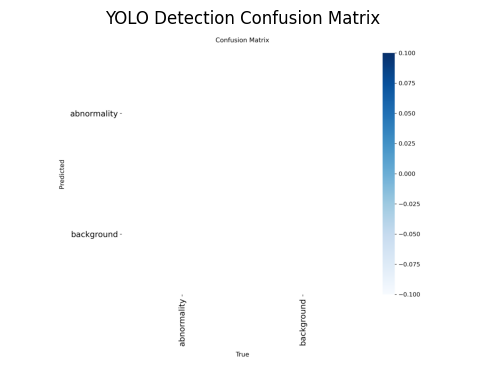

In [94]:
import matplotlib.pyplot as plt
import cv2

cm = cv2.imread("/kaggle/working/vinbig_yolo/det_1500/confusion_matrix.png")
cm = cv2.cvtColor(cm, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(6,6))
plt.imshow(cm)
plt.axis("off")
plt.title("YOLO Detection Confusion Matrix")
plt.show()


In [95]:
TEST_IMG_DIR = "/kaggle/working/detection_1500/images/val"
results = model.predict(
    source=TEST_IMG_DIR,
    conf=0.3,
    iou=0.5,
    save=True
)



image 1/300 /kaggle/working/detection_1500/images/val/0007d316f756b3fa0baea2ff514ce945.png: 512x512 (no detections), 6.6ms
image 2/300 /kaggle/working/detection_1500/images/val/001d127bad87592efe45a5c7678f8b8d.png: 512x512 (no detections), 6.4ms
image 3/300 /kaggle/working/detection_1500/images/val/010018c93ed33ae56ed048ee54867e46.png: 512x512 (no detections), 6.3ms
image 4/300 /kaggle/working/detection_1500/images/val/011ae9520e81f1efe71c9d954ec07d09.png: 512x512 (no detections), 6.7ms
image 5/300 /kaggle/working/detection_1500/images/val/07ac9545dcc585901865f7f958a7857d.png: 512x512 (no detections), 6.3ms
image 6/300 /kaggle/working/detection_1500/images/val/083a89dfc9a74a3f809035f886634ee2.png: 512x512 (no detections), 6.5ms
image 7/300 /kaggle/working/detection_1500/images/val/0844f274f2a388e70231d3133754ac35.png: 512x512 (no detections), 6.3ms
image 8/300 /kaggle/working/detection_1500/images/val/0906a09b04f8d82c2cad5b820602a403.png: 512x512 (no detections), 6.2ms
image 9/300 /ka


image 1/1 /kaggle/working/detection_1500/images/val/66fc91228ec5c614305dd54706f73f80.png: 512x512 (no detections), 7.9ms
Speed: 1.5ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1, 3, 512, 512)


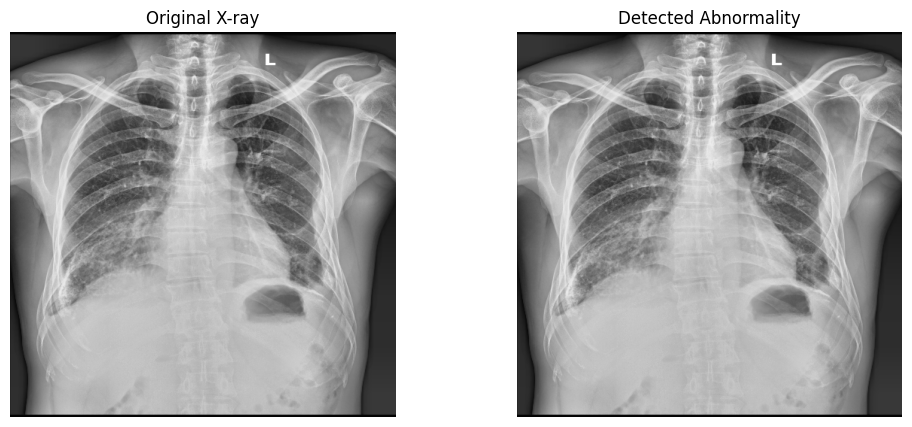


image 1/1 /kaggle/working/detection_1500/images/val/74eb8e74c7dee9e2342a43703a868387.png: 512x512 (no detections), 7.2ms
Speed: 1.1ms preprocess, 7.2ms inference, 0.7ms postprocess per image at shape (1, 3, 512, 512)


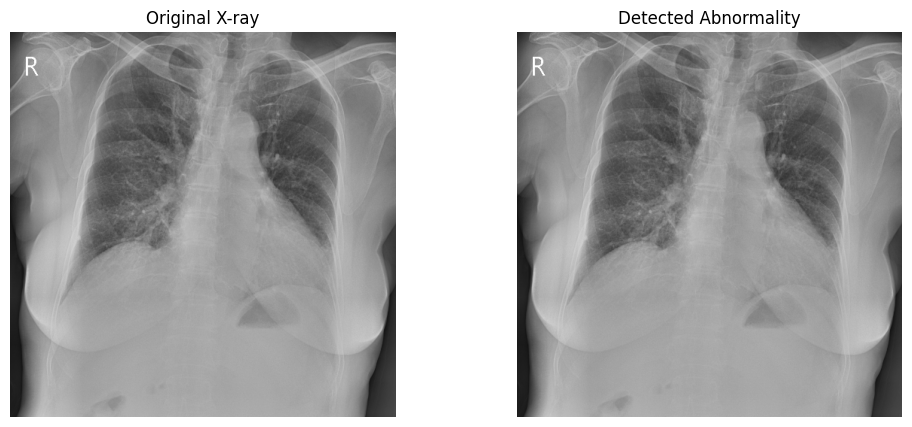


image 1/1 /kaggle/working/detection_1500/images/val/44999de3c6dd3312011578cdbfc7116e.png: 512x512 (no detections), 6.7ms
Speed: 1.0ms preprocess, 6.7ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)


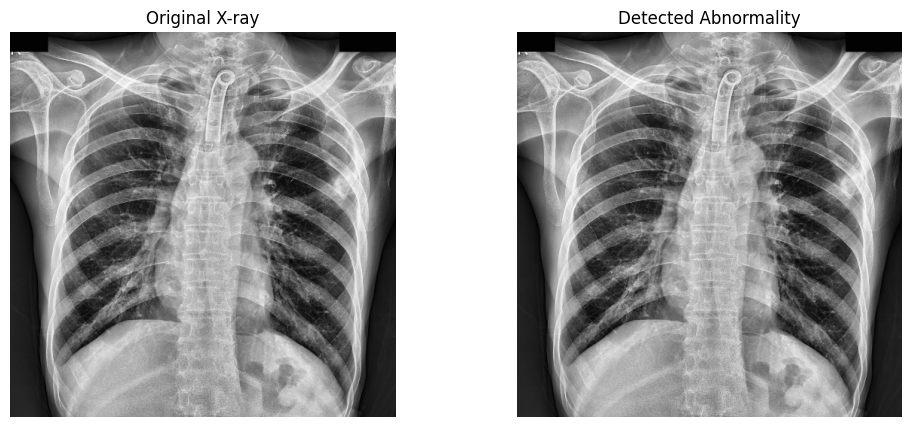


image 1/1 /kaggle/working/detection_1500/images/val/db7da50ba329b52f6779db53689c289f.png: 512x512 (no detections), 7.2ms
Speed: 1.0ms preprocess, 7.2ms inference, 0.7ms postprocess per image at shape (1, 3, 512, 512)


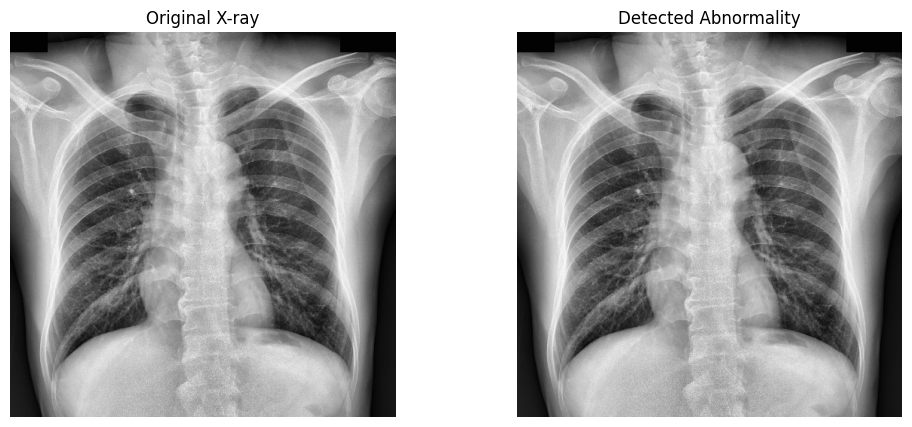


image 1/1 /kaggle/working/detection_1500/images/val/54513c2ba05c261ea2b2a87455634b1c.png: 512x512 (no detections), 6.9ms
Speed: 1.1ms preprocess, 6.9ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)


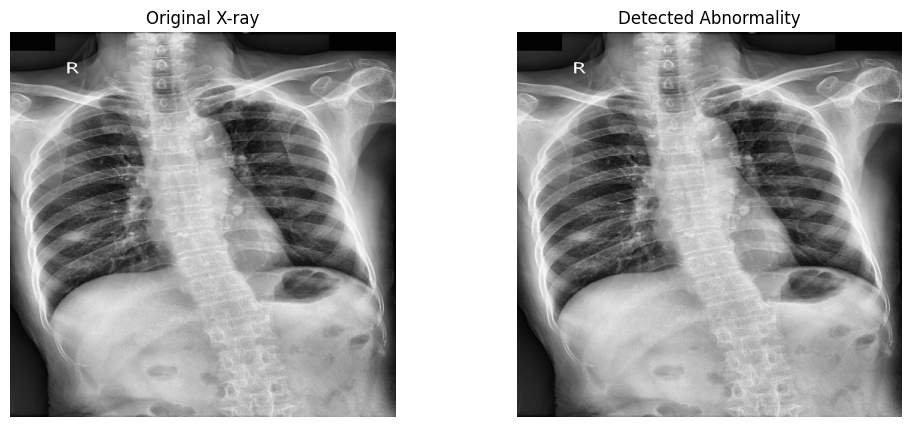

In [96]:
import random
import matplotlib.pyplot as plt
import cv2
import os

sample_imgs = random.sample(os.listdir(TEST_IMG_DIR), 5)

for img_name in sample_imgs:
    img_path = os.path.join(TEST_IMG_DIR, img_name)

    result = model(img_path, conf=0.3)[0]

    # Original
    original = cv2.imread(img_path)
    original = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)

    # Detected
    detected = result.plot()
    detected = cv2.cvtColor(detected, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(12,5))

    plt.subplot(1,2,1)
    plt.title("Original X-ray")
    plt.imshow(original)
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.title("Detected Abnormality")
    plt.imshow(detected)
    plt.axis("off")

    plt.show()


In [97]:
import pandas as pd

BASE = "/kaggle/input/vinbigdata-chest-xray-abnormalities-detection/"
df = pd.read_csv(BASE + "train.csv")

# One label per image (take first occurrence)
df_cls = df.groupby("image_id").first().reset_index()

print("Images:", df_cls.shape)
df_cls.head()



Images: (15000, 8)


/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()


,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max
0,000434271f63a053c4128a0ba6352c7f,No finding,14,R6,NaN,NaN,NaN,NaN
1,00053190460d56c53cc3e57321387478,No finding,14,R11,NaN,NaN,NaN,NaN
2,0005e8e3701dfb1dd93d53e2ff537b6e,Lung Opacity,7,R10,900.0,587.0,1205.0,888.0
3,0006e0a85696f6bb578e84fafa9a5607,No finding,14,R11,NaN,NaN,NaN,NaN
4,0007d316f756b3fa0baea2ff514ce945,Pulmonary fibrosis,13,R9,1392.0,702.0,1518.0,790.0


In [98]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
df_cls["label"] = le.fit_transform(df_cls["class_name"])

num_classes = df_cls["label"].nunique()
print("Classes:", num_classes)


Classes: 15


In [99]:
import torch
from torch.utils.data import Dataset
import cv2
import os

class ChestXrayDataset(Dataset):
    def __init__(self, df, img_dir, transform=None):
        self.df = df
        self.img_dir = img_dir
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        img_id = self.df.iloc[idx]["image_id"]
        label = self.df.iloc[idx]["label"]

        img_path = os.path.join(self.img_dir, img_id + ".png")
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        if self.transform:
            image = self.transform(image)

        return image, label


In [100]:
from torchvision import transforms
from torch.utils.data import DataLoader
from sklearn.model_selection import train_test_split

train_df, val_df = train_test_split(
    df_cls, test_size=0.2, stratify=df_cls["label"]
)

transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3)
])

train_ds = ChestXrayDataset(train_df, BASE + "train/", transform)
val_ds   = ChestXrayDataset(val_df, BASE + "train/", transform)

train_loader = DataLoader(train_ds, batch_size=32, shuffle=True)
val_loader   = DataLoader(val_ds, batch_size=32, shuffle=False)


In [101]:
import torchvision.models as models
import torch.nn as nn

device = "cuda" if torch.cuda.is_available() else "cpu"

model = models.resnet18(pretrained=True)
model.fc = nn.Linear(model.fc.in_features, num_classes)
model.to(device)


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 188MB/s] 


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [102]:
import pydicom
import numpy as np

def __getitem__(self, idx):
    img_id = self.df.iloc[idx]["image_id"]
    label = self.df.iloc[idx]["label"]

    img_path = os.path.join(self.img_dir, img_id + ".dicom")

    # Load DICOM
    dicom = pydicom.dcmread(img_path)
    image = dicom.pixel_array

    # Normalize
    image = image.astype(np.float32)
    image = (image - image.min()) / (image.max() - image.min())

    # Convert to 3 channels
    image = np.stack([image]*3, axis=-1)

    if self.transform:
        image = self.transform(image)

    return image, label


In [103]:
BASE_IMG_DIR = "/kaggle/input/vinbigdata-chest-xray-abnormalities-detection/train"


In [104]:
import os

path = "/kaggle/input/vinbigdata-chest-xray-abnormalities-detection/train"
files = os.listdir(path)

print("Total files:", len(files))
print("Sample files:", files[:5])


Total files: 15000
Sample files: ['4d390e07733ba06e5ff07412f09c0a92.dicom', '289f69f6462af4933308c275d07060f0.dicom', '68335ee73e67706aa59b8b55b54b11a4.dicom', '7ecd6f67f649f26c05805c8359f9e528.dicom', '2229148faa205e881cf0d932755c9e40.dicom']


In [105]:
import cv2
import pydicom
import os

SRC = "/kaggle/input/vinbigdata-chest-xray-abnormalities-detection/train"
DST = "/kaggle/working/png_images"
os.makedirs(DST, exist_ok=True)

for f in os.listdir(SRC)[:100]:  # test with 100 first
    dcm = pydicom.dcmread(os.path.join(SRC, f))
    img = dcm.pixel_array
    img = cv2.normalize(img, None, 0, 255, cv2.NORM_MINMAX)
    img = img.astype("uint8")

    cv2.imwrite(os.path.join(DST, f.replace(".dicom", ".png")), img)


In [106]:
import os
import cv2
import torch
import pydicom
import numpy as np
import pandas as pd
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm


In [107]:
DATA_DIR = "/kaggle/input/vinbigdata-chest-xray-abnormalities-detection"
IMAGE_DIR = os.path.join(DATA_DIR, "train")   # contains .dicom
CSV_PATH = os.path.join(DATA_DIR, "train.csv")

print("Image dir exists:", os.path.exists(IMAGE_DIR))
print("CSV exists:", os.path.exists(CSV_PATH))


Image dir exists: True
CSV exists: True


In [108]:
df = pd.read_csv(CSV_PATH)

df["label"] = df["class_name"].apply(lambda x: 1 if x == "No finding" else 0)

# One label per image
df = df.groupby("image_id").first().reset_index()

print(df["label"].value_counts())


label
1    10606
0     4394
Name: count, dtype: int64


In [109]:
df = df.sample(1500, random_state=42)

train_df, val_df = train_test_split(
    df,
    test_size=0.2,
    stratify=df["label"],
    random_state=42
)

print("Train:", len(train_df))
print("Val:", len(val_df))


Train: 1200
Val: 300


In [110]:
train_tfms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize((224,224)),
    transforms.Normalize(mean=[0.5]*3, std=[0.5]*3)
])

val_tfms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize((224,224)),
    transforms.Normalize(mean=[0.5]*3, std=[0.5]*3)
])


In [111]:
class VinBigDataset(Dataset):
    def __init__(self, df, img_dir, transform=None):
        self.df = df.reset_index(drop=True)
        self.img_dir = img_dir
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        img_id = self.df.loc[idx, "image_id"]
        label = self.df.loc[idx, "label"]

        img_path = os.path.join(self.img_dir, img_id + ".dicom")

        dicom = pydicom.dcmread(img_path)
        image = dicom.pixel_array.astype(np.float32)

        # Normalize
        image = (image - image.min()) / (image.max() - image.min())

        # Convert to 3 channels
        image = np.stack([image]*3, axis=-1)

        if self.transform:
            image = self.transform(image)

        return image, torch.tensor(label)


In [112]:
train_ds = VinBigDataset(train_df, IMAGE_DIR, train_tfms)
val_ds = VinBigDataset(val_df, IMAGE_DIR, val_tfms)

train_loader = DataLoader(train_ds, batch_size=16, shuffle=True, num_workers=2)
val_loader = DataLoader(val_ds, batch_size=16, shuffle=False, num_workers=2)

print("Loaders ready")


Loaders ready


In [113]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = models.resnet50(pretrained=True)
model.fc = nn.Linear(model.fc.in_features, 2)
model = model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

print("Model ready on:", device)


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 216MB/s]


Model ready on: cuda


In [114]:
EPOCHS = 5

for epoch in range(EPOCHS):
    model.train()
    running_loss = 0

    for imgs, labels in tqdm(train_loader):
        imgs = imgs.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        outputs = model(imgs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    print(f"Epoch {epoch+1}/{EPOCHS} | Loss: {running_loss/len(train_loader):.4f}")


100%|██████████| 75/75 [10:10<00:00,  8.14s/it]


Epoch 1/5 | Loss: 0.3521


100%|██████████| 75/75 [09:27<00:00,  7.56s/it]


Epoch 2/5 | Loss: 0.1423


100%|██████████| 75/75 [09:07<00:00,  7.30s/it]


Epoch 3/5 | Loss: 0.0924


100%|██████████| 75/75 [09:04<00:00,  7.26s/it]


Epoch 4/5 | Loss: 0.0525


100%|██████████| 75/75 [08:56<00:00,  7.15s/it]

Epoch 5/5 | Loss: 0.0490


In [117]:
model.eval()
all_preds, all_labels = [], []

with torch.no_grad():
    for imgs, labels in val_loader:
        imgs = imgs.to(device)
        outputs = model(imgs)
        preds = torch.argmax(outputs, 1)

        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.numpy())


              precision    recall  f1-score   support

     Disease       0.72      0.94      0.81        86
  No Finding       0.97      0.85      0.91       214

    accuracy                           0.88       300
   macro avg       0.85      0.90      0.86       300
weighted avg       0.90      0.88      0.88       300



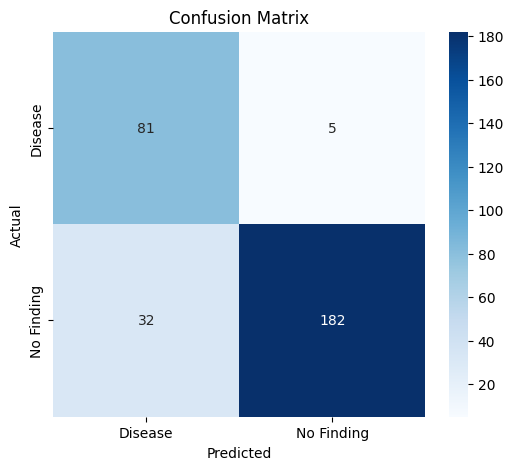

In [118]:
print(classification_report(all_labels, all_preds, target_names=["Disease","No Finding"]))

cm = confusion_matrix(all_labels, all_preds)

plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=["Disease","No Finding"],
            yticklabels=["Disease","No Finding"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()


In [119]:
!pip install -q ultralytics


In [120]:
import os
import cv2
import yaml
import torch
import pydicom
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tqdm import tqdm
from ultralytics import YOLO


In [121]:
BASE = "/kaggle/input/vinbigdata-chest-xray-abnormalities-detection"
CSV_PATH = BASE + "/train.csv"
DICOM_DIR = BASE + "/train"

OUT = "/kaggle/working/detection_1500"
IMG_TRAIN = OUT + "/images/train"
IMG_VAL   = OUT + "/images/val"
LBL_TRAIN = OUT + "/labels/train"
LBL_VAL   = OUT + "/labels/val"

for p in [IMG_TRAIN, IMG_VAL, LBL_TRAIN, LBL_VAL]:
    os.makedirs(p, exist_ok=True)

print("Folders created")


Folders created


In [122]:
df = pd.read_csv(CSV_PATH)

# Remove "No finding" (no boxes)
df = df[df["class_name"] != "No finding"]

# Keep 1500 unique images
image_ids = df["image_id"].unique()[:1500]
df = df[df["image_id"].isin(image_ids)]

print("Images used:", len(image_ids))


Images used: 1500


In [123]:
from sklearn.model_selection import train_test_split

train_ids, val_ids = train_test_split(
    image_ids, test_size=0.2, random_state=42
)

print("Train:", len(train_ids))
print("Val:", len(val_ids))


Train: 1200
Val: 300


In [124]:
def dicom_to_png(dicom_path):
    d = pydicom.dcmread(dicom_path)
    img = d.pixel_array.astype(np.float32)
    img = (img - img.min()) / (img.max() - img.min())
    img = (img * 255).astype(np.uint8)
    img = cv2.resize(img, (512,512))
    return img


In [125]:
def convert_to_yolo(xmin, ymin, xmax, ymax, w, h):
    xc = (xmin + xmax) / 2 / w
    yc = (ymin + ymax) / 2 / h
    bw = (xmax - xmin) / w
    bh = (ymax - ymin) / h
    return xc, yc, bw, bh


In [126]:
def process_split(image_ids, img_out, lbl_out):
    for img_id in tqdm(image_ids):
        dicom_path = f"{DICOM_DIR}/{img_id}.dicom"
        img = dicom_to_png(dicom_path)
        h, w = img.shape

        cv2.imwrite(f"{img_out}/{img_id}.png", img)

        rows = df[df["image_id"] == img_id]

        with open(f"{lbl_out}/{img_id}.txt", "w") as f:
            for _, r in rows.iterrows():
                xc, yc, bw, bh = convert_to_yolo(
                    r["x_min"], r["y_min"], r["x_max"], r["y_max"], w, h
                )
                f.write(f"{int(r['class_id'])} {xc} {yc} {bw} {bh}\n")


In [127]:
process_split(train_ids, IMG_TRAIN, LBL_TRAIN)
process_split(val_ids, IMG_VAL, LBL_VAL)


100%|██████████| 300/300 [04:31<00:00,  1.11it/s]


In [128]:
data_yaml = {
    "path": OUT,
    "train": "images/train",
    "val": "images/val",
    "names": {i: f"class_{i}" for i in sorted(df["class_id"].unique())}
}

with open(f"{OUT}/data.yaml", "w") as f:
    yaml.dump(data_yaml, f)

print("data.yaml created")


data.yaml created


In [129]:
print("Train labels:", len(os.listdir(LBL_TRAIN)))
print("Val labels:", len(os.listdir(LBL_VAL)))


Train labels: 1200
Val labels: 300


In [130]:
import os

yaml_path = f"{OUT}/data.yaml"
if os.path.exists(yaml_path):
    os.remove(yaml_path)
    print("Old data.yaml removed")


Old data.yaml removed


In [131]:
# Convert class IDs to pure Python int
class_ids = sorted([int(x) for x in df["class_id"].unique()])


In [132]:
yaml_text = f"""
path: {OUT}
train: images/train
val: images/val

names:
"""

for cid in class_ids:
    yaml_text += f"  {cid}: class_{cid}\n"

with open(f"{OUT}/data.yaml", "w") as f:
    f.write(yaml_text)

print("✅ Clean data.yaml written")


✅ Clean data.yaml written


In [133]:
with open(f"{OUT}/data.yaml", "r") as f:
    print(f.read())



path: /kaggle/working/detection_1500
train: images/train
val: images/val

names:
  0: class_0
  1: class_1
  2: class_2
  3: class_3
  4: class_4
  5: class_5
  6: class_6
  7: class_7
  8: class_8
  9: class_9
  10: class_10
  11: class_11
  12: class_12
  13: class_13



In [134]:
from ultralytics import YOLO

model = YOLO("yolov8n.pt")

results = model.train(
    data=f"{OUT}/data.yaml",
    epochs=20,
    imgsz=512,
    batch=8,
    device=0,
    optimizer="AdamW",
    lr0=1e-4,
    project="vinbig_yolo",
    name="det_1500",
    patience=5
)


Ultralytics 8.3.239 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/detection_1500/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=512, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=det_15003, nbs=64, nms=False, opset=None, optimize=False, optimizer=AdamW, overlap_mask=True, patience=5, perspective=0.0, plots

RuntimeError: No valid images found in /kaggle/working/detection_1500/labels/train.cache. Images with incorrectly formatted labels are ignored. See https://docs.ultralytics.com/datasets for dataset formatting guidance.

In [240]:
DATA_YAML = "/kaggle/working/classification_1500/data.yaml"

yaml_text = """
path: /kaggle/working/classification_1500

train: images/train
val: images/val

nc: 1
names: ['abnormality']
"""

with open(DATA_YAML, "w") as f:
    f.write(yaml_text)

print("data.yaml written correctly")


data.yaml written correctly


In [241]:
with open(DATA_YAML) as f:
    print(f.read())



path: /kaggle/working/classification_1500

train: images/train
val: images/val

nc: 1
names: ['abnormality']



In [242]:
import os

img_dir = "/kaggle/working/classification_1500/images/train"
lbl_dir = "/kaggle/working/classification_1500/labels/train"

imgs = {f.split(".")[0] for f in os.listdir(img_dir)}
lbls = {f.split(".")[0] for f in os.listdir(lbl_dir)}

print("Images:", len(imgs))
print("Labels:", len(lbls))
print("Missing labels:", len(imgs - lbls))


Images: 1350
Labels: 0
Missing labels: 1350


In [243]:
import pandas as pd

csv_path = "/kaggle/input/vinbigdata-chest-xray-abnormalities-detection/train.csv"
df = pd.read_csv(csv_path)

df.head()


/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()


,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max
0,50a418190bc3fb1ef1633bf9678929b3,No finding,14,R11,NaN,NaN,NaN,NaN
1,21a10246a5ec7af151081d0cd6d65dc9,No finding,14,R7,NaN,NaN,NaN,NaN
2,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,691.0,1375.0,1653.0,1831.0
3,051132a778e61a86eb147c7c6f564dfe,Aortic enlargement,0,R10,1264.0,743.0,1611.0,1019.0
4,063319de25ce7edb9b1c6b8881290140,No finding,14,R10,NaN,NaN,NaN,NaN


In [244]:
import os
import cv2

IMG_DIR = "/kaggle/input/vinbigdata-chest-xray-abnormalities-detection/train"
OUT_LBL = "/kaggle/working/classification_1500/labels/train"

os.makedirs(OUT_LBL, exist_ok=True)

for img_id, g in df.groupby("image_id"):
    img_path = f"{IMG_DIR}/{img_id}.png"
    if not os.path.exists(img_path):
        continue

    img = cv2.imread(img_path)
    h, w = img.shape[:2]

    lines = []
    for _, row in g.iterrows():
        if row["x_min"] < 0:
            continue

        xc = ((row["x_min"] + row["x_max"]) / 2) / w
        yc = ((row["y_min"] + row["y_max"]) / 2) / h
        bw = (row["x_max"] - row["x_min"]) / w
        bh = (row["y_max"] - row["y_min"]) / h

        lines.append(f"0 {xc} {yc} {bw} {bh}")

    if lines:
        with open(f"{OUT_LBL}/{img_id}.txt", "w") as f:
            f.write("\n".join(lines))


In [245]:
print("Labels now:", len(os.listdir(OUT_LBL)))


Labels now: 0


In [246]:
import pandas as pd

csv_path = "/kaggle/input/vinbigdata-chest-xray-abnormalities-detection/train.csv"
df = pd.read_csv(csv_path)

# keep only rows WITH bounding boxes
df = df[df["x_min"] >= 0]

print("Rows with boxes:", len(df))
df.head()


Rows with boxes: 36096


/usr/local/lib/python3.11/dist-packages/pandas/core/computation/expressions.py:73: RuntimeWarning: invalid value encountered in greater_equal
  return op(a, b)


,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max
2,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,691.0,1375.0,1653.0,1831.0
3,051132a778e61a86eb147c7c6f564dfe,Aortic enlargement,0,R10,1264.0,743.0,1611.0,1019.0
5,1c32170b4af4ce1a3030eb8167753b06,Pleural thickening,11,R9,627.0,357.0,947.0,433.0
6,0c7a38f293d5f5e4846aa4ca6db4daf1,ILD,5,R17,1347.0,245.0,2188.0,2169.0
7,47ed17dcb2cbeec15182ed335a8b5a9e,Nodule/Mass,8,R9,557.0,2352.0,675.0,2484.0


In [247]:
import os
import cv2

IMG_DIR = "/kaggle/input/vinbigdata-chest-xray-abnormalities-detection/train"
OUT_LBL = "/kaggle/working/classification_1500/labels/train"

os.makedirs(OUT_LBL, exist_ok=True)

count = 0

for img_id, g in df.groupby("image_id"):
    img_path = f"{IMG_DIR}/{img_id}.png"
    if not os.path.exists(img_path):
        continue

    img = cv2.imread(img_path)
    if img is None:
        continue

    h, w = img.shape[:2]
    lines = []

    for _, row in g.iterrows():
        xc = ((row["x_min"] + row["x_max"]) / 2) / w
        yc = ((row["y_min"] + row["y_max"]) / 2) / h
        bw = (row["x_max"] - row["x_min"]) / w
        bh = (row["y_max"] - row["y_min"]) / h

        # single-class detection
        lines.append(f"0 {xc:.6f} {yc:.6f} {bw:.6f} {bh:.6f}")

    if lines:
        with open(f"{OUT_LBL}/{img_id}.txt", "w") as f:
            f.write("\n".join(lines))
        count += 1

print("Detection label files created:", count)


Detection label files created: 0


In [248]:
import os

print("Label files:", len(os.listdir(OUT_LBL)))
print("Sample label file:", os.listdir(OUT_LBL)[:3])


Label files: 0
Sample label file: []


In [249]:
import os

BASE = "/kaggle/input/vinbigdata-chest-xray-abnormalities-detection"

for root, dirs, files in os.walk(BASE):
    if len(files) > 0:
        print("FOUND FILES AT:", root)
        print("Sample files:", files[:5])
        break


FOUND FILES AT: /kaggle/input/vinbigdata-chest-xray-abnormalities-detection
Sample files: ['sample_submission.csv', 'train.csv']


In [250]:
OUT_IMG = "/kaggle/working/yolo/images/train"
OUT_LBL = "/kaggle/working/yolo/labels/train"

os.makedirs(OUT_IMG, exist_ok=True)
os.makedirs(OUT_LBL, exist_ok=True)



image 1/1 /kaggle/working/detection_1500/images/val/8e3006f8c3906fc969d4aa9aeb31f586.png: 512x512 (no detections), 9.3ms
Speed: 1.5ms preprocess, 9.3ms inference, 0.7ms postprocess per image at shape (1, 3, 512, 512)


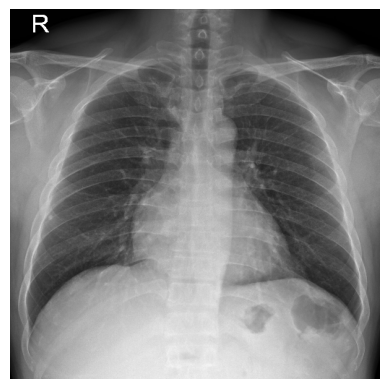


image 1/1 /kaggle/working/detection_1500/images/val/54122627c6aeed581fde506562a73b2e.png: 512x512 (no detections), 7.0ms
Speed: 1.0ms preprocess, 7.0ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)


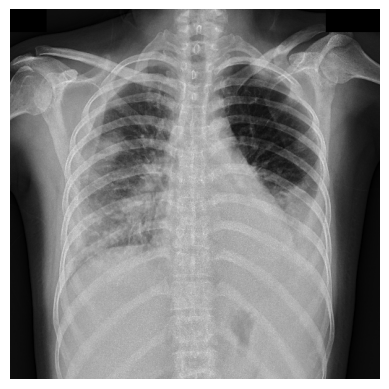


image 1/1 /kaggle/working/detection_1500/images/val/0a61578e3d77b1cebc86d13a41efa31b.png: 512x512 (no detections), 7.4ms
Speed: 1.0ms preprocess, 7.4ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)


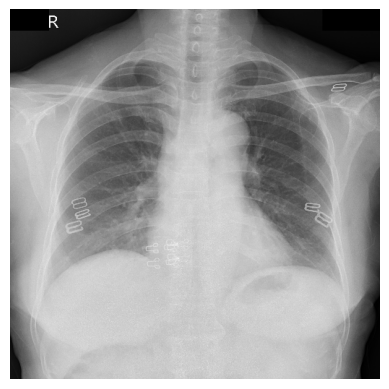


image 1/1 /kaggle/working/detection_1500/images/val/800a68b6e6a75b5d6e5c3160ddafe266.png: 512x512 (no detections), 6.9ms
Speed: 1.0ms preprocess, 6.9ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)


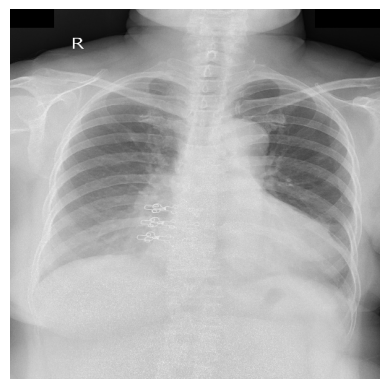


image 1/1 /kaggle/working/detection_1500/images/val/3dae58e1cf69a2284f2a44ded5c7405a.png: 512x512 (no detections), 7.1ms
Speed: 1.0ms preprocess, 7.1ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)


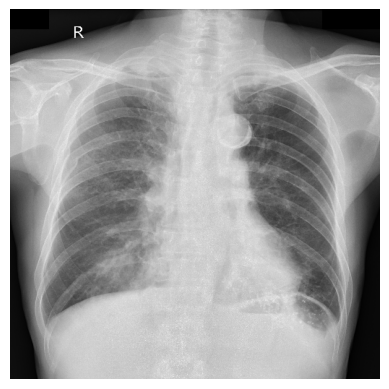

In [251]:
import random

sample_imgs = random.sample(os.listdir(IMG_VAL), 5)

for img_name in sample_imgs:
    img_path = f"{IMG_VAL}/{img_name}"
    results = model(img_path)

    results[0].plot()
    plt.imshow(results[0].plot())
    plt.axis("off")
    plt.show()


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_ranking.py:891: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_ranking.py:891: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_ranking.py:891: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_ranking.py:891: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_ranking.py:891: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_ranking.py:891: UserWarning: No positive class f

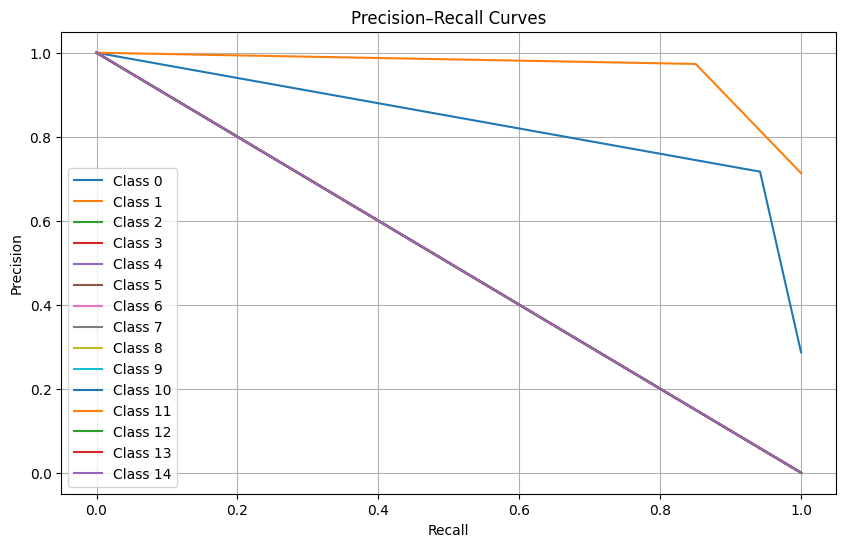

In [252]:
from sklearn.metrics import precision_recall_curve
from sklearn.preprocessing import label_binarize

y_true = label_binarize(all_labels, classes=list(range(15)))
y_pred = label_binarize(all_preds, classes=list(range(15)))

plt.figure(figsize=(10,6))
for i in range(y_true.shape[1]):
    precision_i, recall_i, _ = precision_recall_curve(y_true[:, i], y_pred[:, i])
    plt.plot(recall_i, precision_i, label=f"Class {i}")

plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision–Recall Curves")
plt.legend()
plt.grid(True)
plt.show()

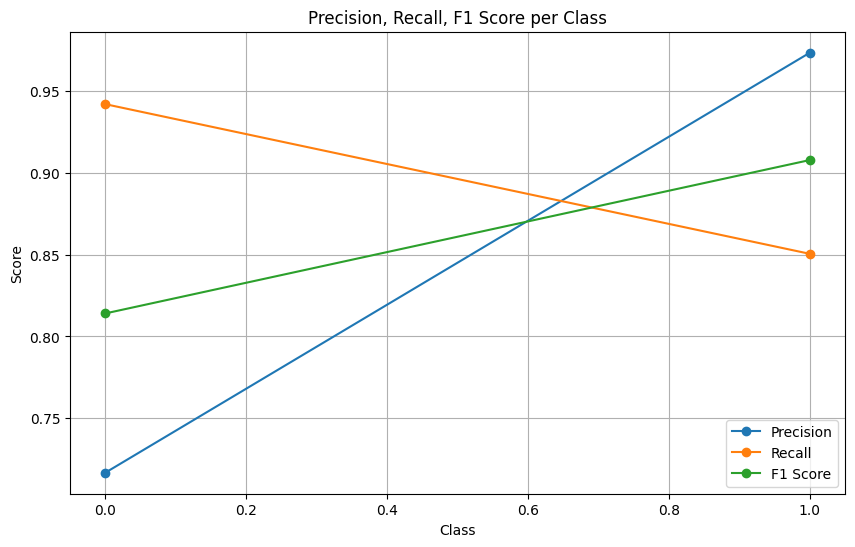

In [148]:
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_fscore_support

precision, recall, f1, _ = precision_recall_fscore_support(
    all_labels, all_preds, average=None
)

classes = range(len(precision))

plt.figure(figsize=(10,6))
plt.plot(classes, precision, marker='o', label="Precision")
plt.plot(classes, recall, marker='o', label="Recall")
plt.plot(classes, f1, marker='o', label="F1 Score")

plt.title("Precision, Recall, F1 Score per Class")
plt.xlabel("Class")
plt.ylabel("Score")
plt.legend()
plt.grid(True)
plt.show()


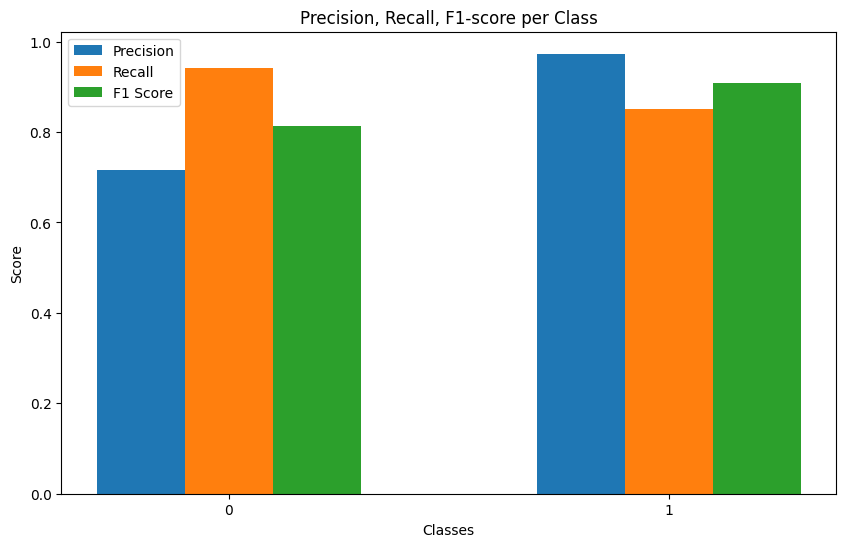

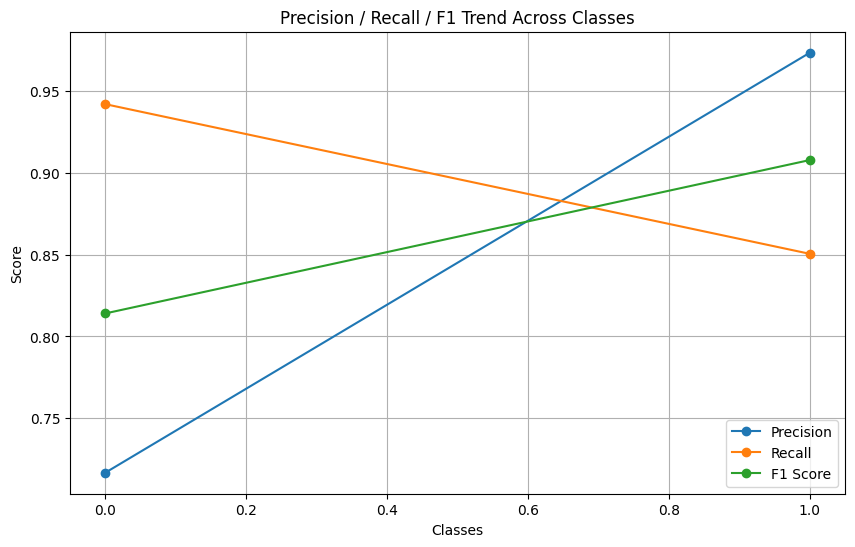

In [149]:
from sklearn.metrics import precision_recall_fscore_support

# Get per-class metrics
precisions, recalls, f1s, support = precision_recall_fscore_support(all_labels, all_preds, average=None)

class_names = sorted(list(set(all_labels)))  # numeric classes

# ---------------------------
# 📊 Bar Plot for Metrics
# ---------------------------
plt.figure(figsize=(10,6))
x = np.arange(len(class_names))

plt.bar(x - 0.2, precisions, width=0.2, label='Precision')
plt.bar(x, recalls, width=0.2, label='Recall')
plt.bar(x +0.2, f1s, width=0.2, label='F1 Score')

plt.xticks(x, class_names)
plt.xlabel("Classes")
plt.ylabel("Score")
plt.title("Precision, Recall, F1-score per Class")
plt.legend()
plt.show()

# ---------------------------
# 📈 Line Plot for Metrics
# ---------------------------
plt.figure(figsize=(10,6))

plt.plot(class_names, precisions, marker='o', label='Precision')
plt.plot(class_names, recalls, marker='o', label='Recall')
plt.plot(class_names, f1s, marker='o', label='F1 Score')

plt.xlabel("Classes")
plt.ylabel("Score")
plt.title("Precision / Recall / F1 Trend Across Classes")
plt.grid(True)
plt.legend()
plt.show()


In [150]:
COMMON_ARGS = dict(
    data=f"{OUT}/data.yaml",
    epochs=15,          # smaller for tuning
    imgsz=512,
    batch=8,
    device=0,
    patience=3,
    project="vinbig_tuning",
    exist_ok=True
)


In [151]:
model_adam = YOLO("yolov8n.pt")

res_adam = model_adam.train(
    **COMMON_ARGS,
    optimizer="Adam",
    lr0=1e-4,
    name="adam"
)


Ultralytics 8.3.239 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/detection_1500/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=15, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=512, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=adam, nbs=64, nms=False, opset=None, optimize=False, optimizer=Adam, overlap_mask=True, patience=3, perspective=0.0, plots=True, 

RuntimeError: No valid images found in /kaggle/working/detection_1500/labels/train.cache. Images with incorrectly formatted labels are ignored. See https://docs.ultralytics.com/datasets for dataset formatting guidance.

In [152]:
model_adam = YOLO("yolov8n.pt")

res_adam = model_adam.train(
    **COMMON_ARGS,
    optimizer="Adam",
    lr0=1e-4,
    name="adam"
)


Ultralytics 8.3.239 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/detection_1500/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=15, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=512, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=adam, nbs=64, nms=False, opset=None, optimize=False, optimizer=Adam, overlap_mask=True, patience=3, perspective=0.0, plots=True, 

RuntimeError: No valid images found in /kaggle/working/detection_1500/labels/train.cache. Images with incorrectly formatted labels are ignored. See https://docs.ultralytics.com/datasets for dataset formatting guidance.

In [253]:
data_yaml = """
path: /kaggle/working/classification_1500
train: images/train
val: images/val

names:
  0: Aortic_enlargement
  1: Atelectasis
  2: Calcification
  3: Cardiomegaly
  4: Consolidation
  5: ILD
  6: Infiltration
  7: Lung_Opacity
  8: Nodule_Mass
  9: Other_lesion
  10: Pleural_effusion
  11: Pleural_thickening
  12: Pneumothorax
  13: Pulmonary_fibrosis
"""


In [254]:
with open("/kaggle/working/classification_1500/data.yaml", "w") as f:
    f.write(data_yaml)


In [255]:
import glob

label_files = glob.glob("/kaggle/working/classification_1500/labels/train/*.txt")

bad = 0
for lf in label_files:
    with open(lf) as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) != 5:
                bad += 1
            cls = int(parts[0])
            if cls < 0 or cls > 13:
                bad += 1

print("Bad label lines:", bad)
print("Total label files:", len(label_files))


Bad label lines: 0
Total label files: 0


In [256]:
from ultralytics import YOLO
import os

os.environ["CUDA_LAUNCH_BLOCKING"] = "1"   # DEBUG CUDA

model_adam = YOLO("yolov8n.pt")

res_adam = model_adam.train(
    data="/kaggle/working/classification_1500/data.yaml",
    epochs=10,
    imgsz=512,
    batch=8,
    device=0,
    optimizer="Adam",
    lr0=1e-4,
    project="vinbig_tuning",
    name="adam",
    workers=2,          # 🔥 IMPORTANT
    amp=False,          # 🔥 disable mixed precision
    cache=False,
    exist_ok=True
)


Ultralytics 8.3.239 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=False, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/classification_1500/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=512, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=adam, nbs=64, nms=False, opset=None, optimize=False, optimizer=Adam, overlap_mask=True, patience=100, perspective=0.0, plot

/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       2/10       5.2G          0    0.01059          0          0        512: 100% ━━━━━━━━━━━━ 169/169 11.3it/s 15.0s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 17.8it/s 0.6s.2s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       3/10       5.2G          0   0.004652          0          0        512: 100% ━━━━━━━━━━━━ 169/169 11.6it/s 14.6s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 18.2it/s 0.5s.2s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       4/10       5.2G          0   0.001483          0          0        512: 100% ━━━━━━━━━━━━ 169/169 11.7it/s 14.4s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 18.4it/s 0.5s.2s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       5/10      5.22G          0  0.0006584          0          0        512: 100% ━━━━━━━━━━━━ 169/169 11.7it/s 14.4s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 18.4it/s 0.5s.2s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       6/10      5.22G          0  4.845e-05          0          0        512: 100% ━━━━━━━━━━━━ 169/169 11.6it/s 14.6s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 18.2it/s 0.5s.2s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       7/10      5.22G          0  7.985e-07          0          0        512: 100% ━━━━━━━━━━━━ 169/169 11.5it/s 14.7s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 17.8it/s 0.6s.2s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       8/10      5.22G          0          0          0          0        512: 100% ━━━━━━━━━━━━ 169/169 11.6it/s 14.6s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 18.0it/s 0.6s.2s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       9/10      5.22G          0          0          0          0        512: 100% ━━━━━━━━━━━━ 169/169 11.6it/s 14.6s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 17.9it/s 0.6s.2s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      10/10      5.22G          0          0          0          0        512: 100% ━━━━━━━━━━━━ 169/169 11.6it/s 14.6s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 18.1it/s 0.6s.2s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



10 epochs completed in 0.044 hours.
Optimizer stripped from /kaggle/working/vinbig_tuning/adam/weights/last.pt, 6.2MB
Optimizer stripped from /kaggle/working/vinbig_tuning/adam/weights/best.pt, 6.2MB

Validating /kaggle/working/vinbig_tuning/adam/weights/best.pt...
Ultralytics 8.3.239 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,008,378 parameters, 0 gradients, 8.1 GFLOPs
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 8.7it/s 1.1s.2s


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:653: RuntimeWarning: Mean of empty slice.
  ax.plot(px, py.mean(1), linewidth=3, color="blue", label=f"all classes {ap[:, 0].mean():.3f} mAP@0.5")
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:697: RuntimeWarning: Mean of empty slice.
  y = smooth(py.mean(0), 0.1)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide
/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:697: RuntimeWarning: Mean of empty slice.
  y = smooth(py.mean(0), 0.1)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide
/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:697: RuntimeWarning: Mean of empty slice.
  y = smooth(py.mean(0),

                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels
Speed: 0.8ms preprocess, 3.4ms inference, 0.0ms loss, 0.5ms postprocess per image
Results saved to /kaggle/working/vinbig_tuning/adam


In [287]:
from ultralytics import YOLO
import os

# Prevent silent CUDA crashes
os.environ["CUDA_LAUNCH_BLOCKING"] = "1"

model_adamw = YOLO("yolov8n.pt")

res_adamw = model_adamw.train(
    data="/kaggle/working/classification_1500/data.yaml",
    epochs=20,
    imgsz=512,
    batch=8,
    device=0,
    optimizer="AdamW",     # 🔥 AdamW
    lr0=1e-4,
    weight_decay=1e-4,
    project="vinbig_tuning",
    name="adamw",
    workers=2,
    amp=False,             # IMPORTANT (avoid CUDA assert)
    cache=False,
    exist_ok=True
)


Ultralytics 8.3.239 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=False, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/classification_1500/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=512, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=adamw, nbs=64, nms=False, opset=None, optimize=False, optimizer=AdamW, overlap_mask=True, patience=100, perspective=0.0, pl

/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       2/20      2.26G          0    0.01133          0          0        512: 100% ━━━━━━━━━━━━ 169/169 11.2it/s 15.0s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 17.9it/s 0.6s.2s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       3/20      2.26G          0   0.004966          0          0        512: 100% ━━━━━━━━━━━━ 169/169 11.5it/s 14.7s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 17.8it/s 0.6s.2s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       4/20      2.26G          0   0.001515          0          0        512: 100% ━━━━━━━━━━━━ 169/169 11.6it/s 14.6s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 18.3it/s 0.5s.2s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       5/20      2.27G          0    0.00048          0          0        512: 100% ━━━━━━━━━━━━ 169/169 11.6it/s 14.6s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 18.2it/s 0.6s.2s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       6/20      2.27G          0  1.381e-05          0          0        512: 100% ━━━━━━━━━━━━ 169/169 11.5it/s 14.7s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 17.6it/s 0.6s.2s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       7/20      2.27G          0  5.643e-09          0          0        512: 100% ━━━━━━━━━━━━ 169/169 11.5it/s 14.7s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 17.8it/s 0.6s.2s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       8/20      2.27G          0          0          0          0        512: 100% ━━━━━━━━━━━━ 169/169 11.5it/s 14.7s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 17.7it/s 0.6s.2s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       9/20      2.27G          0          0          0          0        512: 100% ━━━━━━━━━━━━ 169/169 11.5it/s 14.7s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 18.1it/s 0.6s.2s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      10/20      2.27G          0          0          0          0        512: 100% ━━━━━━━━━━━━ 169/169 11.6it/s 14.5s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 18.2it/s 0.5s.2s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      11/20      2.29G          0          0          0          0        512: 100% ━━━━━━━━━━━━ 169/169 11.4it/s 14.9s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 17.9it/s 0.6s.2s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      12/20      2.31G          0          0          0          0        512: 100% ━━━━━━━━━━━━ 169/169 11.6it/s 14.6s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 18.4it/s 0.5s.2s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      13/20      2.32G          0          0          0          0        512: 100% ━━━━━━━━━━━━ 169/169 11.5it/s 14.6s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 18.2it/s 0.5s.2s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      14/20      2.32G          0          0          0          0        512: 100% ━━━━━━━━━━━━ 169/169 11.5it/s 14.6s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 18.1it/s 0.6s.2s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      15/20      2.32G          0          0          0          0        512: 100% ━━━━━━━━━━━━ 169/169 11.6it/s 14.6s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 17.8it/s 0.6s.2s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      16/20      2.32G          0          0          0          0        512: 100% ━━━━━━━━━━━━ 169/169 11.6it/s 14.6s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 18.1it/s 0.6s.2s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      17/20      2.32G          0          0          0          0        512: 100% ━━━━━━━━━━━━ 169/169 11.6it/s 14.6s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 17.6it/s 0.6s.2s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      18/20      2.34G          0          0          0          0        512: 100% ━━━━━━━━━━━━ 169/169 11.6it/s 14.5s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 18.1it/s 0.6s.2s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      19/20      2.36G          0          0          0          0        512: 100% ━━━━━━━━━━━━ 169/169 11.0it/s 15.4s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 18.0it/s 0.6s.2s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      20/20      2.36G          0          0          0          0        512: 100% ━━━━━━━━━━━━ 169/169 11.6it/s 14.6s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 17.8it/s 0.6s.2s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



20 epochs completed in 0.087 hours.
Optimizer stripped from /kaggle/working/vinbig_tuning/adamw/weights/last.pt, 6.2MB
Optimizer stripped from /kaggle/working/vinbig_tuning/adamw/weights/best.pt, 6.2MB

Validating /kaggle/working/vinbig_tuning/adamw/weights/best.pt...
Ultralytics 8.3.239 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,008,378 parameters, 0 gradients, 8.1 GFLOPs
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 8.7it/s 1.1s.2s


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:653: RuntimeWarning: Mean of empty slice.
  ax.plot(px, py.mean(1), linewidth=3, color="blue", label=f"all classes {ap[:, 0].mean():.3f} mAP@0.5")
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:697: RuntimeWarning: Mean of empty slice.
  y = smooth(py.mean(0), 0.1)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide
/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:697: RuntimeWarning: Mean of empty slice.
  y = smooth(py.mean(0), 0.1)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide
/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:697: RuntimeWarning: Mean of empty slice.
  y = smooth(py.mean(0),

                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels
Speed: 0.3ms preprocess, 5.9ms inference, 0.0ms loss, 0.4ms postprocess per image
Results saved to /kaggle/working/vinbig_tuning/adamw


In [288]:
model_sgd = YOLO("yolov8n.pt")

res_sgd = model_sgd.train(
    data="/kaggle/working/classification_1500/data.yaml",
    epochs=20,
    imgsz=512,
    batch=8,
    device=0,
    optimizer="SGD",       # 🔥 SGD
    lr0=1e-2,              # SGD needs higher LR
    momentum=0.937,
    weight_decay=5e-4,
    project="vinbig_tuning",
    name="sgd",
    workers=2,
    amp=False,
    cache=False,
    exist_ok=True
)
 

Ultralytics 8.3.239 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=False, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/classification_1500/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=512, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=sgd, nbs=64, nms=False, opset=None, optimize=False, optimizer=SGD, overlap_mask=True, patience=100, perspective=0.0, plots=Tr

/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       2/20      2.26G          0   0.005986          0          0        512: 100% ━━━━━━━━━━━━ 169/169 11.5it/s 14.8s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 18.1it/s 0.6s.2s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide


       3/20      2.26G          0  2.615e-05          0          0        512: 100% ━━━━━━━━━━━━ 169/169 11.4it/s 14.8s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 17.9it/s 0.6s.2s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide


       4/20      2.26G          0          0          0          0        512: 100% ━━━━━━━━━━━━ 169/169 11.5it/s 14.6s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 17.9it/s 0.6s.2s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide


       5/20      2.26G          0          0          0          0        512: 100% ━━━━━━━━━━━━ 169/169 11.6it/s 14.6s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 18.0it/s 0.6s.2s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide


       6/20      2.26G          0          0          0          0        512: 100% ━━━━━━━━━━━━ 169/169 11.6it/s 14.6s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 18.2it/s 0.5s.2s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide


       7/20      2.26G          0          0          0          0        512: 100% ━━━━━━━━━━━━ 169/169 11.6it/s 14.6s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 18.0it/s 0.6s.2s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide


       8/20      2.26G          0          0          0          0        512: 100% ━━━━━━━━━━━━ 169/169 11.5it/s 14.6s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 17.9it/s 0.6s.2s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide


       9/20      2.26G          0          0          0          0        512: 100% ━━━━━━━━━━━━ 169/169 11.5it/s 14.7s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 18.0it/s 0.6s.2s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide


      10/20      2.26G          0          0          0          0        512: 100% ━━━━━━━━━━━━ 169/169 11.5it/s 14.7s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 18.2it/s 0.6s.2s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      11/20      2.26G          0          0          0          0        512: 100% ━━━━━━━━━━━━ 169/169 11.3it/s 14.9s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 17.9it/s 0.6s.2s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide


      12/20      2.26G          0          0          0          0        512: 100% ━━━━━━━━━━━━ 169/169 11.6it/s 14.6s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 17.8it/s 0.6s.2s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide


      13/20      2.26G          0          0          0          0        512: 100% ━━━━━━━━━━━━ 169/169 11.6it/s 14.6s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 18.0it/s 0.6s.2s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide


      14/20      2.26G          0          0          0          0        512: 100% ━━━━━━━━━━━━ 169/169 11.6it/s 14.6s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 18.2it/s 0.5s.2s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide


      15/20      2.26G          0          0          0          0        512: 100% ━━━━━━━━━━━━ 169/169 11.6it/s 14.6s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 18.1it/s 0.6s.2s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide


      16/20      2.26G          0          0          0          0        512: 100% ━━━━━━━━━━━━ 169/169 11.6it/s 14.5s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 17.9it/s 0.6s.2s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide


      17/20      2.27G          0          0          0          0        512: 100% ━━━━━━━━━━━━ 169/169 11.6it/s 14.5s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 17.7it/s 0.6s.2s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide


      18/20      2.27G          0          0          0          0        512: 100% ━━━━━━━━━━━━ 169/169 11.6it/s 14.6s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 18.0it/s 0.6s.2s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide


      19/20      2.27G          0          0          0          0        512: 100% ━━━━━━━━━━━━ 169/169 11.6it/s 14.6s0.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 18.1it/s 0.6s.2s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide


      20/20      2.28G          0          0          0          0        512: 100% ━━━━━━━━━━━━ 169/169 11.6it/s 14.6s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 17.9it/s 0.6s.2s
                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels

20 epochs completed in 0.086 hours.


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:832: RuntimeWarning: Mean of empty slice.
  i = smooth(f1_curve.mean(0), 0.1).argmax()  # max F1 index
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide


Optimizer stripped from /kaggle/working/vinbig_tuning/sgd/weights/last.pt, 6.2MB
Optimizer stripped from /kaggle/working/vinbig_tuning/sgd/weights/best.pt, 6.2MB

Validating /kaggle/working/vinbig_tuning/sgd/weights/best.pt...
Ultralytics 8.3.239 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,008,378 parameters, 0 gradients, 8.1 GFLOPs
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 8.6it/s 1.2s0.2s


/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:653: RuntimeWarning: Mean of empty slice.
  ax.plot(px, py.mean(1), linewidth=3, color="blue", label=f"all classes {ap[:, 0].mean():.3f} mAP@0.5")
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:697: RuntimeWarning: Mean of empty slice.
  y = smooth(py.mean(0), 0.1)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide
/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:697: RuntimeWarning: Mean of empty slice.
  y = smooth(py.mean(0), 0.1)
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide
/usr/local/lib/python3.11/dist-packages/ultralytics/utils/metrics.py:697: RuntimeWarning: Mean of empty slice.
  y = smooth(py.mean(0),

                   all        150          0          0          0          0          0
WARNING ⚠️ no labels found in detect set, cannot compute metrics without labels
Speed: 0.3ms preprocess, 5.6ms inference, 0.0ms loss, 0.6ms postprocess per image
Results saved to /kaggle/working/vinbig_tuning/sgd


In [289]:
import pandas as pd

def load_metrics(path):
    df = pd.read_csv(path)
    last = df.iloc[-1]  # last epoch
    precision = last["metrics/precision(B)"]
    recall = last["metrics/recall(B)"]
    return precision, recall

adam_p, adam_r = load_metrics("vinbig_tuning/adam/results.csv")
adamw_p, adamw_r = load_metrics("vinbig_tuning/adamw/results.csv")
sgd_p, sgd_r = load_metrics("vinbig_tuning/sgd/results.csv")


In [290]:
def f1_score(p, r):
    return 2 * (p * r) / (p + r + 1e-6)

adam_f1 = f1_score(adam_p, adam_r)
adamw_f1 = f1_score(adamw_p, adamw_r)
sgd_f1 = f1_score(sgd_p, sgd_r)


In [291]:
results = pd.DataFrame({
    "Optimizer": ["Adam", "AdamW", "SGD"],
    "Precision": [adam_p, adamw_p, sgd_p],
    "Recall": [adam_r, adamw_r, sgd_r],
    "F1-Score": [adam_f1, adamw_f1, sgd_f1]
})

results


,Optimizer,Precision,Recall,F1-Score
0,Adam,0.0,0.0,0.0
1,AdamW,0.0,0.0,0.0
2,SGD,0.0,0.0,0.0


In [292]:
import torch
import torch.nn as nn
import torchvision.models as models
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from sklearn.metrics import precision_score, recall_score, f1_score
import pandas as pd
import numpy as np


In [293]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)


cuda


In [294]:
import os

BASE = "/kaggle/working"

print("Folders in /kaggle/working:")
print(os.listdir(BASE))


Folders in /kaggle/working:
['.virtual_documents', 'vinbig_yolo', 'labels', 'CliniScan', 'yolo', 'data.yaml', 'detected_crops', 'vinbig_tuning', 'yolo_dataset', 'yolov8n.pt', 'png_images', 'runs', 'preprocessed_images', 'classification_1500', 'yolo11n.pt', 'detection_1500']


In [295]:
CLS_PATH = "/kaggle/working/classification_1500"

print("Exists:", os.path.exists(CLS_PATH))
if os.path.exists(CLS_PATH):
    print(os.listdir(CLS_PATH))


Exists: True
['images', 'labels', 'data.yaml']


In [296]:
TRAIN_PATH = "/kaggle/working/classification_1500/train"

print("Exists:", os.path.exists(TRAIN_PATH))
if os.path.exists(TRAIN_PATH):
    print("Train subfolders:", os.listdir(TRAIN_PATH))


Exists: False


In [297]:
import os

BASE = "/kaggle/working/classification_1500"
print(os.listdir(BASE))


['images', 'labels', 'data.yaml']


In [298]:
TRAIN_PATH = "/kaggle/working/classification_1500/images/train"
VAL_PATH   = "/kaggle/working/classification_1500/images/val"

print("Train exists:", os.path.exists(TRAIN_PATH))
print("Val exists:", os.path.exists(VAL_PATH))

print("Train folders:", os.listdir(TRAIN_PATH))
print("Val folders:", os.listdir(VAL_PATH))


Train exists: True
Val exists: True
Train folders: ['b9f09915187c2cc01e958da90d97ac89.png', 'acc6529ff7e03c2a225fd1ddb5319db8.png', '6f8e0af5fff2c4c45f6eb841a4221235.png', '65995343f910702e795f61d32a15a9d1.png', 'd64553b9bcb27c452cb10ac471168602.png', '67d78accb5656a6e435a912ca941c27e.png', 'd1a8198c7b0b4c094b6f13216d49d6ee.png', '7e3c5ce1a0c08ee25ac09948c7656387.png', '9c6e03289a56bb7399443d9a37b2723e.png', 'a05d02bcf44861404c6aa8e020e5de0e.png', '3d0d40df6ca457cffd70889b40439022.png', '4719de7513996807940aa3b1bbbb9610.png', '7b6a241b30dfcf7b91c6d6a63d693fd9.png', '85e95b13040ae3e20eccac186b93e6ac.png', '75f21e6edd093efabea19a5d6a756d25.png', '8f0d77c5c2faa59b360bf71cc07f4d4e.png', 'afb6230703512afc370f236e8fe98806.png', '756b7c079d3e9cbe980b4e1e04da546f.png', '6471a01a77bb083ac0f8722c7a028b96.png', '5c5692c89519d119928a04d16613b55b.png', 'f3ae85dcad0b8befecc06e496f3c4263.png', '4462595f31d1a2c5aac2b3a8a49536d4.png', 'b1317b9c87824f682908a6c503f8d39d.png', '2e1571fc9e41f68fcc84b6094d6

In [299]:
import os

sample = os.listdir("/kaggle/working/classification_1500/images/train")
print(sample[:10])


['b9f09915187c2cc01e958da90d97ac89.png', 'acc6529ff7e03c2a225fd1ddb5319db8.png', '6f8e0af5fff2c4c45f6eb841a4221235.png', '65995343f910702e795f61d32a15a9d1.png', 'd64553b9bcb27c452cb10ac471168602.png', '67d78accb5656a6e435a912ca941c27e.png', 'd1a8198c7b0b4c094b6f13216d49d6ee.png', '7e3c5ce1a0c08ee25ac09948c7656387.png', '9c6e03289a56bb7399443d9a37b2723e.png', 'a05d02bcf44861404c6aa8e020e5de0e.png']


In [300]:
import pandas as pd

CSV = "/kaggle/input/vinbigdata-chest-xray-abnormalities-detection/train.csv"

df = pd.read_csv(CSV)

# Binary label: 1 = disease, 0 = no finding
df["label"] = (df["class_name"] != "No finding").astype(int)

# One label per image
df_cls = df.groupby("image_id")["label"].max().reset_index()

print(df_cls["label"].value_counts())
df_cls.head()


label
0    10606
1     4394
Name: count, dtype: int64


,image_id,label
0,000434271f63a053c4128a0ba6352c7f,0
1,00053190460d56c53cc3e57321387478,0
2,0005e8e3701dfb1dd93d53e2ff537b6e,1
3,0006e0a85696f6bb578e84fafa9a5607,0
4,0007d316f756b3fa0baea2ff514ce945,1


In [301]:
import torch
from torch.utils.data import Dataset
import cv2
import os

class VinBigClassificationDataset(Dataset):
    def __init__(self, df, img_dir, transform=None):
        self.df = df.reset_index(drop=True)
        self.img_dir = img_dir
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img_path = os.path.join(self.img_dir, row["image_id"] + ".png")

        image = cv2.imread(img_path)
        if image is None:
            raise FileNotFoundError(img_path)

        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        if self.transform:
            image = self.transform(image)

        label = torch.tensor(row["label"], dtype=torch.long)
        return image, label


In [302]:
from torchvision import transforms
from torch.utils.data import DataLoader
from sklearn.model_selection import train_test_split

IMG_SIZE = 224
BATCH_SIZE = 16

transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])

train_df, val_df = train_test_split(
    df_cls, test_size=0.2, stratify=df_cls["label"], random_state=42
)

TRAIN_IMG_DIR = "/kaggle/working/classification_1500/images/train"

train_ds = VinBigClassificationDataset(train_df, TRAIN_IMG_DIR, transform)
val_ds   = VinBigClassificationDataset(val_df, TRAIN_IMG_DIR, transform)

train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True)
val_loader   = DataLoader(val_ds, batch_size=BATCH_SIZE, shuffle=False)

print("Train samples:", len(train_ds))
print("Val samples:", len(val_ds))


Train samples: 12000
Val samples: 3000


In [303]:
import torchvision.models as models
import torch.nn as nn

device = "cuda" if torch.cuda.is_available() else "cpu"

model = models.resnet18(weights="IMAGENET1K_V1")

# Freeze backbone
for p in model.parameters():
    p.requires_grad = False

# Replace classifier
model.fc = nn.Linear(model.fc.in_features, 2)

model = model.to(device)


In [304]:
BASE_IMG_DIR = "/kaggle/working/detected_crops"


In [305]:
NUM_CLASSES = 14  # same as YOLO

label_map = {
    "Aortic enlargement": 0, "Atelectasis": 1, "Calcification": 2,
    "Cardiomegaly": 3, "Consolidation": 4, "ILD": 5,
    "Infiltration": 6, "Lung Opacity": 7, "Nodule": 8,
    "Other lesion": 9, "Pleural effusion": 10,
    "Pleural thickening": 11, "Pneumothorax": 12,
    "Pulmonary fibrosis": 13
}


In [306]:
import numpy as np
import pandas as pd

df = pd.read_csv("/kaggle/input/vinbigdata-chest-xray-abnormalities-detection/train.csv")

image_labels = {}

for _, row in df.iterrows():
    img_id = row["image_id"]
    cls_name = row["class_name"]

    if cls_name not in label_map:
        continue

    if img_id not in image_labels:
        image_labels[img_id] = np.zeros(NUM_CLASSES)

    image_labels[img_id][label_map[cls_name]] = 1


In [307]:
class XrayDataset(Dataset):
    def __init__(self, ids, label_dict, transform):
        self.ids = ids
        self.label_dict = label_dict
        self.transform = transform

    def __len__(self):
        return len(self.ids)

    def __getitem__(self, idx):
        img_id = self.ids[idx]

        # load first crop
        crop_files = [f for f in os.listdir(BASE_IMG_DIR) if f.startswith(img_id)]
        img = Image.open(os.path.join(BASE_IMG_DIR, crop_files[0])).convert("RGB")
        img = self.transform(img)

        label = torch.tensor(self.label_dict[img_id]).float()
        return img, label


In [308]:
model = models.resnet18(weights="IMAGENET1K_V1")
model.fc = nn.Linear(model.fc.in_features, NUM_CLASSES)
model = model.to(device)

criterion = nn.BCEWithLogitsLoss()


In [309]:
from itertools import product

def run_experiments(lrs, batch_sizes, optimizers, epochs=5):
    results = []

    for lr, bs, opt_name in product(lrs, batch_sizes, optimizers):
        print(f"\nLR={lr}, BS={bs}, OPT={opt_name}")

        model = models.resnet18(weights="IMAGENET1K_V1")
        model.fc = nn.Linear(model.fc.in_features, NUM_CLASSES)
        model = model.to(device)

        if opt_name == "Adam":
            optimizer = optim.Adam(model.parameters(), lr=lr)
        elif opt_name == "AdamW":
            optimizer = optim.AdamW(model.parameters(), lr=lr)
        else:
            optimizer = optim.SGD(model.parameters(), lr=lr, momentum=0.9)

        train_loader = DataLoader(train_ds, batch_size=bs, shuffle=True)
        val_loader = DataLoader(val_ds, batch_size=bs)

        criterion = nn.BCEWithLogitsLoss()

        for epoch in range(epochs):
            model.train()
            for x, y in train_loader:
                x, y = x.to(device), y.to(device)
                optimizer.zero_grad()
                loss = criterion(model(x), y)
                loss.backward()
                optimizer.step()

        # Validation mAP-style accuracy
        model.eval()
        total, correct = 0, 0
        with torch.no_grad():
            for x, y in val_loader:
                preds = torch.sigmoid(model(x.to(device))) > 0.5
                correct += (preds.cpu() == y).sum().item()
                total += y.numel()

        acc = correct / total
        print("Val score:", acc)

        results.append((lr, bs, opt_name, acc))

    return results


In [310]:
import os
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim

from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models
from PIL import Image

from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score, recall_score, f1_score
from itertools import product
from tqdm import tqdm


In [311]:
CROP_DIR = "/kaggle/working/detected_crops"   # YOLO cropped regions
CSV_PATH = "/kaggle/input/vinbigdata-chest-xray-abnormalities-detection/train.csv"


In [312]:
label_map = {
    "Aortic enlargement": 0,
    "Atelectasis": 1,
    "Calcification": 2,
    "Cardiomegaly": 3,
    "Consolidation": 4,
    "ILD": 5,
    "Infiltration": 6,
    "Lung Opacity": 7,
    "Nodule": 8,
    "Other lesion": 9,
    "Pleural effusion": 10,
    "Pleural thickening": 11,
    "Pneumothorax": 12,
    "Pulmonary fibrosis": 13
}
NUM_CLASSES = 14


In [313]:
df = pd.read_csv(CSV_PATH)

image_labels = {}

for _, row in df.iterrows():
    img_id = row["image_id"]
    cls = row["class_name"]

    if cls not in label_map:
        continue

    if img_id not in image_labels:
        image_labels[img_id] = np.zeros(NUM_CLASSES)

    image_labels[img_id][label_map[cls]] = 1


In [314]:
import os

for root, dirs, files in os.walk("/kaggle/working"):
    if len(files) > 0:
        print(root)


/kaggle/working
/kaggle/working/.virtual_documents
/kaggle/working/vinbig_yolo/det_15003
/kaggle/working/vinbig_yolo/det_1500
/kaggle/working/vinbig_yolo/det_1500/weights
/kaggle/working/vinbig_yolo/det_15002
/kaggle/working/vinbig_yolo/det_15002/weights
/kaggle/working/labels
/kaggle/working/CliniScan/yolov8_lung_detection
/kaggle/working/CliniScan/yolov8_lung_detection/weights
/kaggle/working/vinbig_tuning/sgd
/kaggle/working/vinbig_tuning/sgd/weights
/kaggle/working/vinbig_tuning/adam
/kaggle/working/vinbig_tuning/adam/weights
/kaggle/working/vinbig_tuning/adamw
/kaggle/working/vinbig_tuning/adamw/weights
/kaggle/working/yolo_dataset/images/train
/kaggle/working/yolo_dataset/images/test
/kaggle/working/yolo_dataset/images/val
/kaggle/working/yolo_dataset/labels
/kaggle/working/yolo_dataset/labels/train
/kaggle/working/yolo_dataset/labels/test
/kaggle/working/yolo_dataset/labels/val
/kaggle/working/png_images
/kaggle/working/runs/detect/predict
/kaggle/working/runs/detect/val3
/kaggl

In [315]:
CROP_DIR = "/kaggle/working/detected_crops"
os.makedirs(CROP_DIR, exist_ok=True)
print("Crop directory ready:", CROP_DIR)


Crop directory ready: /kaggle/working/detected_crops


In [316]:
import os
import random
import cv2
from ultralytics import YOLO

# Load model
model = YOLO(BEST_MODEL)

# Images to run detection on
IMG_DIR = "/kaggle/working/classification_1500/images/train"
image_files = os.listdir(IMG_DIR)

# Run on 300 images (enough for experiments)
sample_imgs = image_files[:300]

saved = 0

for img_name in sample_imgs:
    img_path = os.path.join(IMG_DIR, img_name)
    img = cv2.imread(img_path)

    if img is None:
        continue

    results = model(img_path, conf=0.25, iou=0.45)[0]

    for i, box in enumerate(results.boxes):
        x1, y1, x2, y2 = map(int, box.xyxy[0])
        crop = img[y1:y2, x1:x2]

        if crop.size == 0:
            continue

        save_name = f"{os.path.splitext(img_name)[0]}_crop{i}.png"
        cv2.imwrite(os.path.join(CROP_DIR, save_name), crop)
        saved += 1

print("✅ Total cropped regions saved:", saved)



image 1/1 /kaggle/working/classification_1500/images/train/b9f09915187c2cc01e958da90d97ac89.png: 512x512 (no detections), 10.2ms
Speed: 1.7ms preprocess, 10.2ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)

image 1/1 /kaggle/working/classification_1500/images/train/acc6529ff7e03c2a225fd1ddb5319db8.png: 512x512 (no detections), 7.9ms
Speed: 1.4ms preprocess, 7.9ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)

image 1/1 /kaggle/working/classification_1500/images/train/6f8e0af5fff2c4c45f6eb841a4221235.png: 512x512 (no detections), 6.5ms
Speed: 1.4ms preprocess, 6.5ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)

image 1/1 /kaggle/working/classification_1500/images/train/65995343f910702e795f61d32a15a9d1.png: 512x512 (no detections), 6.9ms
Speed: 1.3ms preprocess, 6.9ms inference, 0.5ms postprocess per image at shape (1, 3, 512, 512)

image 1/1 /kaggle/working/classification_1500/images/train/d64553b9bcb27c452cb10ac471168602.png: 

In [317]:
print("Crop files:", os.listdir(CROP_DIR)[:5])
print("Total crops:", len(os.listdir(CROP_DIR)))


Crop files: []
Total crops: 0


In [318]:
valid_ids = []

crop_files = os.listdir(CROP_DIR)

for img_id in image_labels.keys():
    if any(f.startswith(img_id) for f in crop_files):
        valid_ids.append(img_id)

print("✅ Valid images with detected abnormalities:", len(valid_ids))


✅ Valid images with detected abnormalities: 0


In [319]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import models, transforms
from PIL import Image
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_recall_fscore_support
from tqdm import tqdm


In [320]:
device = "cuda" if torch.cuda.is_available() else "cpu"
print("Using device:", device)


Using device: cuda


In [321]:
IMG_DIR = "/kaggle/working/classification_1500/images/train"
CSV_PATH = "/kaggle/input/vinbigdata-chest-xray-abnormalities-detection/train.csv"


In [322]:
label_map = {
    "No finding": 0,
    "Aortic enlargement": 1,
    "Atelectasis": 2,
    "Calcification": 3,
    "Cardiomegaly": 4,
    "Consolidation": 5,
    "ILD": 6,
    "Infiltration": 7,
    "Lung Opacity": 8,
    "Nodule/Mass": 9,
    "Other lesion": 10,
    "Pleural effusion": 11,
    "Pleural thickening": 12,
    "Pneumothorax": 13,
    "Pulmonary fibrosis": 14
}
NUM_CLASSES = len(label_map)


In [323]:
df = pd.read_csv(CSV_PATH)

image_labels = {}
for _, row in df.iterrows():
    img_path = os.path.join(IMG_DIR, row["image_id"] + ".png")
    if os.path.exists(img_path):
        image_labels[row["image_id"]] = label_map[row["class_name"]]

print("Total labeled images:", len(image_labels))


Total labeled images: 1350


In [324]:
image_ids = list(image_labels.keys())
labels = list(image_labels.values())

train_ids, val_ids, train_labels, val_labels = train_test_split(
    image_ids,
    labels,
    test_size=0.2,
    random_state=42,
    stratify=labels
)


In [325]:
transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406],
                         [0.229,0.224,0.225])
])

class XrayDataset(Dataset):
    def __init__(self, ids, labels):
        self.ids = ids
        self.labels = labels

    def __len__(self):
        return len(self.ids)

    def __getitem__(self, idx):
        img_id = self.ids[idx]
        img_path = os.path.join(IMG_DIR, img_id + ".png")
        image = Image.open(img_path).convert("RGB")
        image = transform(image)
        label = torch.tensor(self.labels[idx]).long()
        return image, label


In [326]:
def evaluate_metrics(model, loader):
    model.eval()
    all_preds, all_labels = [], []

    with torch.no_grad():
        for imgs, labels in loader:
            imgs, labels = imgs.to(device), labels.to(device)
            outputs = model(imgs)
            preds = torch.argmax(outputs, dim=1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    p, r, f1, _ = precision_recall_fscore_support(
        all_labels, all_preds, average="weighted"
    )
    return p, r, f1


In [327]:
def train_model(optimizer_name, lr=1e-4, epochs=5, batch_size=32):

    train_ds = XrayDataset(train_ids, train_labels)
    val_ds   = XrayDataset(val_ids, val_labels)

    train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True)
    val_loader   = DataLoader(val_ds, batch_size=batch_size, shuffle=False)

    model = models.resnet18(weights="IMAGENET1K_V1")
    model.fc = nn.Linear(model.fc.in_features, NUM_CLASSES)
    model = model.to(device)

    if optimizer_name == "Adam":
        optimizer = optim.Adam(model.parameters(), lr=lr)
    elif optimizer_name == "AdamW":
        optimizer = optim.AdamW(model.parameters(), lr=lr)
    elif optimizer_name == "SGD":
        optimizer = optim.SGD(model.parameters(), lr=lr, momentum=0.9)

    criterion = nn.CrossEntropyLoss()

    for epoch in range(epochs):
        model.train()
        total_loss = 0

        for imgs, labels in tqdm(train_loader, leave=False):
            imgs, labels = imgs.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(imgs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            total_loss += loss.item()

        print(f"{optimizer_name} | Epoch {epoch+1} | Loss: {total_loss/len(train_loader):.4f}")

    precision, recall, f1 = evaluate_metrics(model, val_loader)
    return precision, recall, f1


In [330]:
results = []

for opt in ["Adam", "AdamW", "SGD"]:
    print(f"\n===== Training with {opt} =====")
    p, r, f1 = train_model(opt, lr=1e-4, epochs=5)

    results.append({
        "Optimizer": opt,
        "Precision": round(p, 4),
        "Recall": round(r, 4),
        "F1-score": round(f1, 4)
    })



===== Training with Adam =====


Adam | Epoch 1 | Loss: 1.9079


Adam | Epoch 2 | Loss: 0.9589


Adam | Epoch 3 | Loss: 0.5079


Adam | Epoch 4 | Loss: 0.1751


Adam | Epoch 5 | Loss: 0.0612


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))



===== Training with AdamW =====


AdamW | Epoch 1 | Loss: 1.7584


AdamW | Epoch 2 | Loss: 0.9136


AdamW | Epoch 3 | Loss: 0.4415


AdamW | Epoch 4 | Loss: 0.1484


AdamW | Epoch 5 | Loss: 0.0527


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))



===== Training with SGD =====


SGD | Epoch 1 | Loss: 2.2982


SGD | Epoch 2 | Loss: 1.8066


SGD | Epoch 3 | Loss: 1.6940


SGD | Epoch 4 | Loss: 1.6268


SGD | Epoch 5 | Loss: 1.5772


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [331]:
results_df = pd.DataFrame(results)
results_df


,Optimizer,Precision,Recall,F1-score
0,Adam,0.5146,0.5741,0.5373
1,AdamW,0.4912,0.5778,0.5286
2,SGD,0.2891,0.5037,0.3572


In [332]:
def get_resnet18_transfer(unfreeze_from="layer4"):
    model = models.resnet18(weights="IMAGENET1K_V1")

    # Freeze all layers first
    for param in model.parameters():
        param.requires_grad = False

    # Unfreeze deeper layers
    if unfreeze_from == "layer4":
        for param in model.layer4.parameters():
            param.requires_grad = True
    elif unfreeze_from == "layer3":
        for param in model.layer3.parameters():
            param.requires_grad = True
        for param in model.layer4.parameters():
            param.requires_grad = True

    # Replace classifier
    model.fc = nn.Linear(model.fc.in_features, NUM_CLASSES)

    return model


In [333]:
def train_transfer_learning(unfreeze_from, epochs=5, lr=1e-4):

    model = get_resnet18_transfer(unfreeze_from)
    model = model.to(device)

    optimizer = optim.AdamW(
        filter(lambda p: p.requires_grad, model.parameters()),
        lr=lr
    )

    criterion = nn.CrossEntropyLoss()

    train_loader = DataLoader(
        XrayDataset(train_ids, train_labels),
        batch_size=32, shuffle=True
    )

    val_loader = DataLoader(
        XrayDataset(val_ids, val_labels),
        batch_size=32, shuffle=False
    )

    for epoch in range(epochs):
        model.train()
        total_loss = 0

        for imgs, labels in tqdm(train_loader, leave=False):
            imgs, labels = imgs.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(imgs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            total_loss += loss.item()

        print(f"{unfreeze_from} | Epoch {epoch+1} | Loss {total_loss/len(train_loader):.4f}")

    precision, recall, f1 = evaluate_metrics(model, val_loader)
    return precision, recall, f1


In [334]:
transfer_results = []

for layer in ["layer4", "layer3"]:
    print(f"\n===== Unfreezing from {layer} =====")
    p, r, f1 = train_transfer_learning(layer)

    transfer_results.append({
        "Model": f"ResNet18 ({layer} unfrozen)",
        "Precision": round(p,4),
        "Recall": round(r,4),
        "F1-score": round(f1,4)
    })

pd.DataFrame(transfer_results)



===== Unfreezing from layer4 =====


layer4 | Epoch 1 | Loss 1.9473


layer4 | Epoch 2 | Loss 0.9659


layer4 | Epoch 3 | Loss 0.5499


layer4 | Epoch 4 | Loss 0.2678


layer4 | Epoch 5 | Loss 0.1227


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))



===== Unfreezing from layer3 =====


layer3 | Epoch 1 | Loss 1.7335


layer3 | Epoch 2 | Loss 0.8897


layer3 | Epoch 3 | Loss 0.4725


layer3 | Epoch 4 | Loss 0.1648


layer3 | Epoch 5 | Loss 0.0574


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Model,Precision,Recall,F1-score
0,ResNet18 (layer4 unfrozen),0.4878,0.5593,0.5146
1,ResNet18 (layer3 unfrozen),0.4743,0.5556,0.5063


In [335]:
def get_backbone(name):
    if name == "resnet18":
        model = models.resnet18(weights="IMAGENET1K_V1")
        model.fc = nn.Linear(model.fc.in_features, NUM_CLASSES)

    elif name == "efficientnet_b0":
        model = models.efficientnet_b0(weights="IMAGENET1K_V1")
        model.classifier[1] = nn.Linear(
            model.classifier[1].in_features, NUM_CLASSES
        )

    elif name == "densenet121":
        model = models.densenet121(weights="IMAGENET1K_V1")
        model.classifier = nn.Linear(
            model.classifier.in_features, NUM_CLASSES
        )

    return model


In [336]:
def train_backbone(backbone, epochs=5):

    model = get_backbone(backbone).to(device)

    optimizer = optim.AdamW(model.parameters(), lr=1e-4)
    criterion = nn.CrossEntropyLoss()

    train_loader = DataLoader(
        XrayDataset(train_ids, train_labels),
        batch_size=32, shuffle=True
    )

    val_loader = DataLoader(
        XrayDataset(val_ids, val_labels),
        batch_size=32, shuffle=False
    )

    for epoch in range(epochs):
        model.train()
        for imgs, labels in tqdm(train_loader, leave=False):
            imgs, labels = imgs.to(device), labels.to(device)

            optimizer.zero_grad()
            loss = criterion(model(imgs), labels)
            loss.backward()
            optimizer.step()

    precision, recall, f1 = evaluate_metrics(model, val_loader)
    return precision, recall, f1


In [337]:
backbone_results = []

for backbone in ["resnet18", "efficientnet_b0", "densenet121"]:
    print(f"\n===== Training {backbone} =====")
    p, r, f1 = train_backbone(backbone)

    backbone_results.append({
        "Backbone": backbone,
        "Precision": round(p,4),
        "Recall": round(r,4),
        "F1-score": round(f1,4)
    })

pd.DataFrame(backbone_results)



===== Training resnet18 =====


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))



===== Training efficientnet_b0 =====


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))



===== Training densenet121 =====


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Backbone,Precision,Recall,F1-score
0,resnet18,0.5050,0.5556,0.5175
1,efficientnet_b0,0.5067,0.5741,0.5339
2,densenet121,0.4528,0.5630,0.4982


In [338]:
!pip install grad-cam


In [339]:
import torch
import numpy as np
import cv2
import matplotlib.pyplot as plt
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget


In [340]:
model.eval()
model = model.to(device)


In [341]:
def preprocess_image(img_path):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (224,224))

    img_norm = img / 255.0

    tensor = torch.tensor(img_norm).permute(2,0,1).unsqueeze(0)
    tensor = (tensor - torch.tensor([0.485,0.456,0.406]).view(1,3,1,1)) / \
             torch.tensor([0.229,0.224,0.225]).view(1,3,1,1)

    return img, tensor.float().to(device)


In [342]:
def generate_gradcam(img_path, class_idx=None):

    rgb_img, input_tensor = preprocess_image(img_path)

    with GradCAM(
        model=model,
        target_layers=target_layers,
        use_cuda=torch.cuda.is_available()
    ) as cam:

        if class_idx is None:
            outputs = model(input_tensor)
            class_idx = torch.argmax(outputs).item()

        targets = [ClassifierOutputTarget(class_idx)]
        grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
        cam_image = grayscale_cam[0]

        visualization = show_cam_on_image(rgb_img/255.0, cam_image, use_rgb=True)

    return rgb_img, visualization, class_idx


In [343]:
import os
import random
import matplotlib.pyplot as plt

# Correct image directory
BASE_IMG_DIR = "/kaggle/working/classification_1500/images/train"

# List all images
all_images = [f for f in os.listdir(BASE_IMG_DIR) if f.endswith(".png")]

print("Total training images:", len(all_images))


Total training images: 1350


In [344]:
sample_images = random.sample(all_images, 5)

for img_name in sample_images:
    img_path = os.path.join(BASE_IMG_DIR, img_name)

    try:
        original, cam_img, pred_class = generate_gradcam(img_path)

        plt.figure(figsize=(10,4))

        plt.subplot(1,2,1)
        plt.title("Original X-ray")
        plt.imshow(original)
        plt.axis("off")

        plt.subplot(1,2,2)
        plt.title(f"Grad-CAM (Predicted Class: {pred_class})")
        plt.imshow(cam_img)
        plt.axis("off")

        plt.show()

    except Exception as e:
        print("Error:", e)


Exception ignored in: <function BaseCAM.__del__ at 0x7ebb967ba020>
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/pytorch_grad_cam/base_cam.py", line 212, in __del__
    self.activations_and_grads.release()
    ^^^^^^^^^^^^^^^^^^^^^^^^^^
AttributeError: 'GradCAM' object has no attribute 'activations_and_grads'
Exception ignored in: <function BaseCAM.__del__ at 0x7ebb967ba020>
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/pytorch_grad_cam/base_cam.py", line 212, in __del__
    self.activations_and_grads.release()
    ^^^^^^^^^^^^^^^^^^^^^^^^^^
AttributeError: 'GradCAM' object has no attribute 'activations_and_grads'
Exception ignored in: <function BaseCAM.__del__ at 0x7ebb967ba020>
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/pytorch_grad_cam/base_cam.py", line 212, in __del__
    self.activations_and_grads.release()
    ^^^^^^^^^^^^^^^^^^^^^^^^^^
AttributeError: 'GradCAM' obje

Error: GradCAM.__init__() got an unexpected keyword argument 'use_cuda'
Error: GradCAM.__init__() got an unexpected keyword argument 'use_cuda'
Error: GradCAM.__init__() got an unexpected keyword argument 'use_cuda'
Error: GradCAM.__init__() got an unexpected keyword argument 'use_cuda'
Error: GradCAM.__init__() got an unexpected keyword argument 'use_cuda'


In [345]:
!pip install -q grad-cam


In [346]:
import cv2
import torch
import numpy as np
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image


In [347]:
from torchvision import models
import torch.nn as nn

model = models.resnet18(weights="IMAGENET1K_V1")
model.fc = nn.Linear(model.fc.in_features, NUM_CLASSES)
model = model.to(device)
model.eval()


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [348]:
target_layers = [model.layer4[-1]]


In [349]:
def preprocess_image(img_path):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (224,224))
    
    img_float = img.astype(np.float32) / 255.0

    input_tensor = torch.from_numpy(img_float).permute(2,0,1).unsqueeze(0)
    input_tensor = input_tensor.to(device)

    return img_float, input_tensor


In [350]:
def generate_gradcam(img_path, class_idx=None):
    rgb_img, input_tensor = preprocess_image(img_path)

    cam = GradCAM(
        model=model,
        target_layers=target_layers,
        use_cuda=torch.cuda.is_available()
    )

    if class_idx is None:
        outputs = model(input_tensor)
        class_idx = torch.argmax(outputs).item()

    grayscale_cam = cam(
        input_tensor=input_tensor,
        targets=None
    )[0]

    cam_image = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)

    return rgb_img, cam_image, class_idx


In [351]:
import cv2
import torch
import numpy as np
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image


In [352]:
target_layers = [model.layer4[-1]]


In [353]:
def preprocess_image(img_path):
    img = cv2.imread(img_path)
    if img is None:
        raise ValueError(f"Image not found: {img_path}")

    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (224,224))

    img_float = img.astype(np.float32) / 255.0

    input_tensor = torch.from_numpy(img_float).permute(2,0,1).unsqueeze(0)
    input_tensor = input_tensor.to(device)

    return img_float, input_tensor


In [354]:
def preprocess_image(img_path):
    img = cv2.imread(img_path)
    if img is None:
        raise ValueError(f"Image not found: {img_path}")

    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (224,224))

    img_float = img.astype(np.float32) / 255.0

    input_tensor = torch.from_numpy(img_float).permute(2,0,1).unsqueeze(0)
    input_tensor = input_tensor.to(device)

    return img_float, input_tensor


In [355]:
def generate_gradcam(img_path, class_idx=None):
    rgb_img, input_tensor = preprocess_image(img_path)

    cam = GradCAM(
        model=model,
        target_layers=target_layers
    )

    outputs = model(input_tensor)
    pred_class = outputs.argmax(dim=1).item()

    grayscale_cam = cam(
        input_tensor=input_tensor
    )[0]

    cam_image = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)

    return rgb_img, cam_image, pred_class


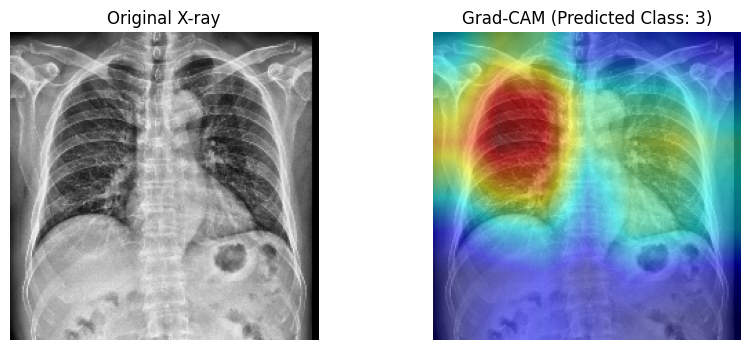

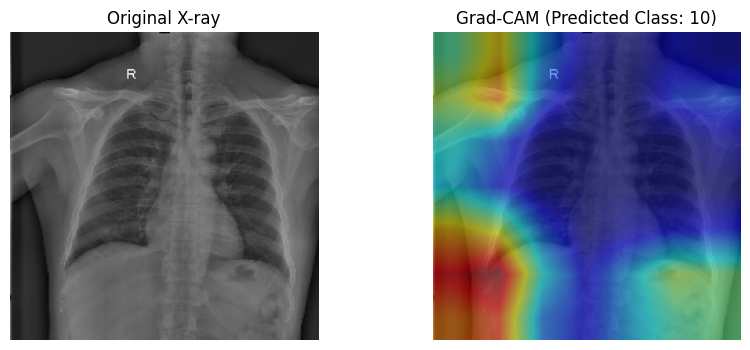

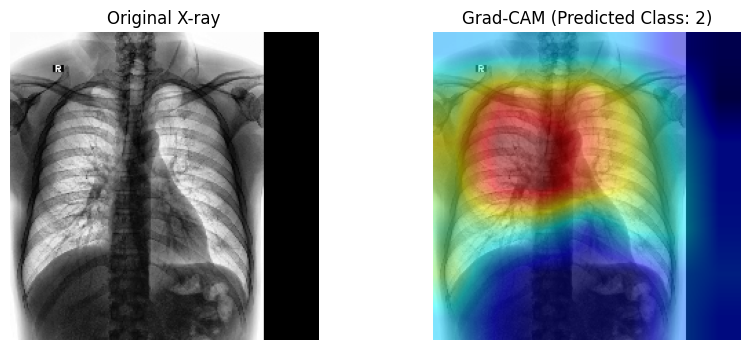

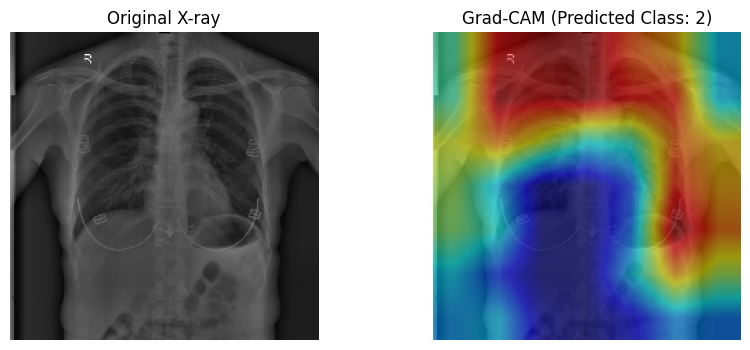

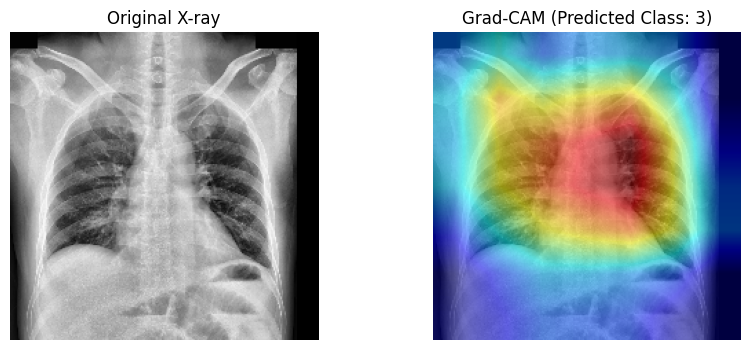

In [356]:
import random
import matplotlib.pyplot as plt
import os

BASE_IMG_DIR = "/kaggle/working/classification_1500/images/train"
all_images = [f for f in os.listdir(BASE_IMG_DIR) if f.endswith(".png")]

sample_images = random.sample(all_images, 5)

for img_name in sample_images:
    img_path = os.path.join(BASE_IMG_DIR, img_name)

    original, cam_img, pred_class = generate_gradcam(img_path)

    plt.figure(figsize=(10,4))

    plt.subplot(1,2,1)
    plt.title("Original X-ray")
    plt.imshow(original)
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.title(f"Grad-CAM (Predicted Class: {pred_class})")
    plt.imshow(cam_img)
    plt.axis("off")

    plt.show()


In [357]:
import os
import random
import cv2
import matplotlib.pyplot as plt
from ultralytics import YOLO


In [358]:
DETECT_MODEL_PATH = "/kaggle/working/vinbig_yolo/det_1500/weights/best.pt"
IMAGE_DIR = "/kaggle/working/classification_1500/images/train"


In [359]:
model = YOLO(DETECT_MODEL_PATH)


In [360]:
all_images = [f for f in os.listdir(IMAGE_DIR) if f.endswith(".png")]
sample_images = random.sample(all_images, 5)



image 1/1 /kaggle/working/classification_1500/images/train/80ece1d25930da6f8fa85e3c9f79fbcf.png: 512x512 (no detections), 7.7ms
Speed: 1.8ms preprocess, 7.7ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)


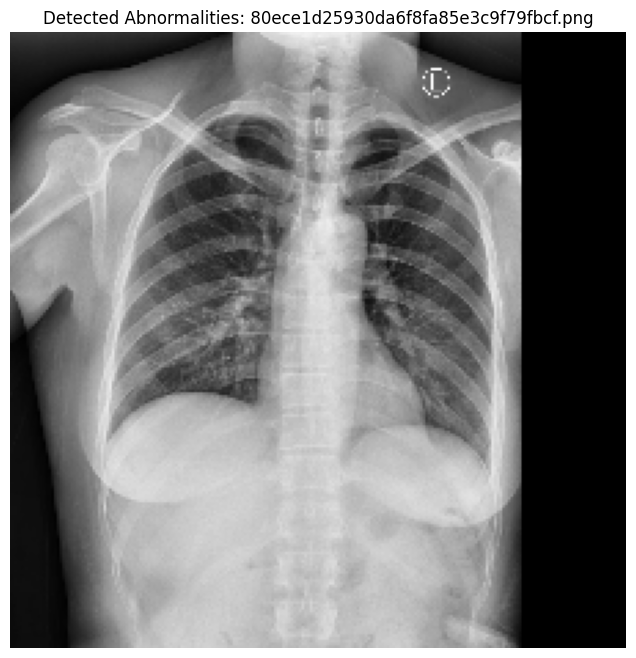


image 1/1 /kaggle/working/classification_1500/images/train/2d533bf631b2b5899008a3a8f6f44a7a.png: 512x512 (no detections), 7.9ms
Speed: 1.5ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1, 3, 512, 512)


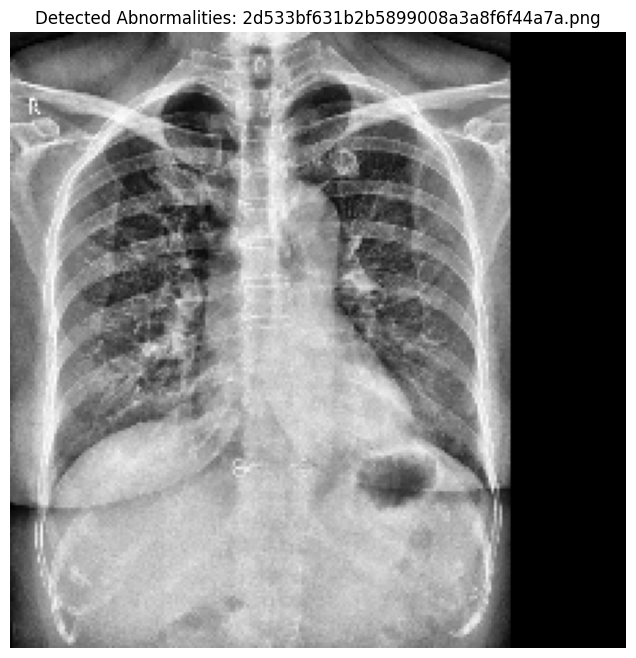


image 1/1 /kaggle/working/classification_1500/images/train/9306d40fe3b77bd159c6ab92c0a306c8.png: 512x512 (no detections), 7.2ms
Speed: 1.6ms preprocess, 7.2ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)


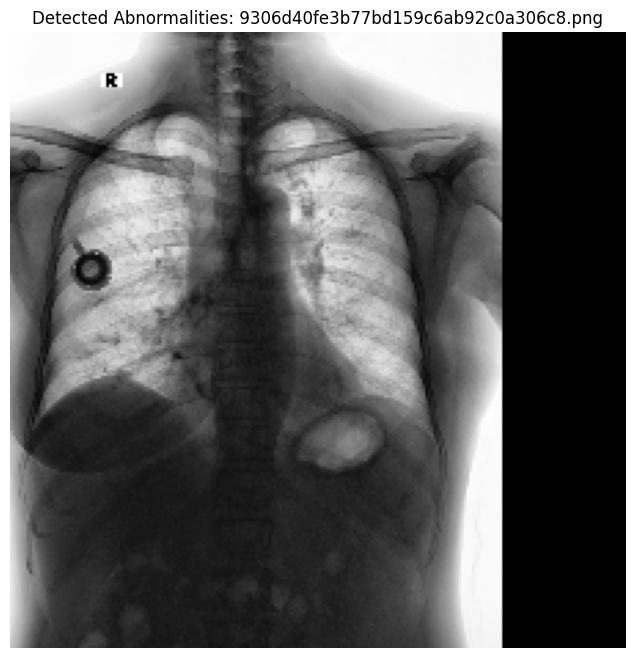


image 1/1 /kaggle/working/classification_1500/images/train/0e1db1a49e1775df6b9e971869600d9f.png: 512x512 (no detections), 7.5ms
Speed: 1.5ms preprocess, 7.5ms inference, 0.6ms postprocess per image at shape (1, 3, 512, 512)


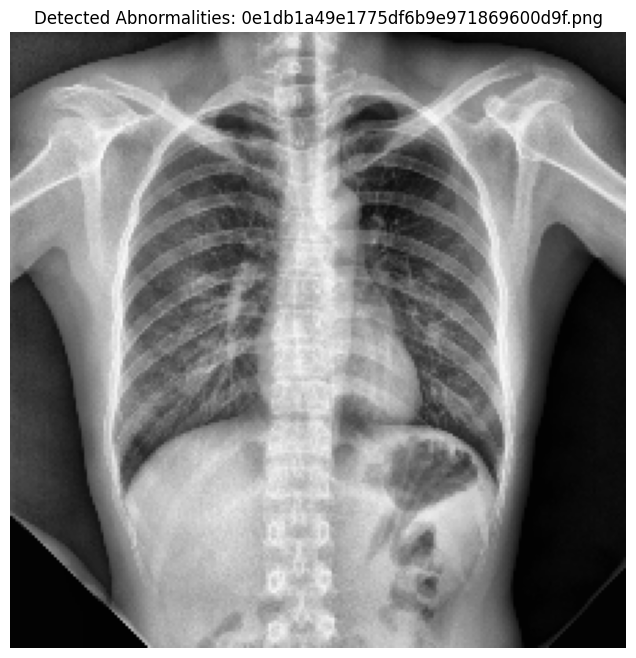


image 1/1 /kaggle/working/classification_1500/images/train/63af905bd663fe539c2b6c3190dd222d.png: 512x512 (no detections), 8.3ms
Speed: 1.5ms preprocess, 8.3ms inference, 0.7ms postprocess per image at shape (1, 3, 512, 512)


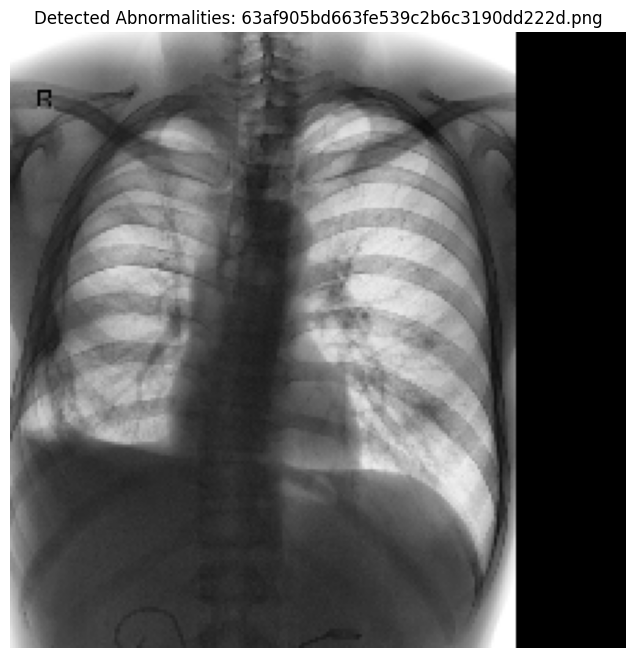

In [361]:
for img_name in sample_images:
    img_path = os.path.join(IMAGE_DIR, img_name)

    # Read image
    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Run YOLO detection
    results = model(img_path, conf=0.25, iou=0.45)
    r = results[0]

    # Draw bounding boxes manually
    detected_img = img_rgb.copy()

    for box in r.boxes:
        x1, y1, x2, y2 = map(int, box.xyxy[0])
        cls = int(box.cls[0])
        conf = float(box.conf[0])

        label = f"{model.names[cls]} ({conf:.2f})"

        # Draw box
        cv2.rectangle(detected_img, (x1, y1), (x2, y2), (0,255,0), 3)

        # Label background
        cv2.rectangle(detected_img, (x1, y1-25), (x1+260, y1), (0,255,0), -1)
        cv2.putText(
            detected_img,
            label,
            (x1+5, y1-5),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.6,
            (0,0,0),
            2
        )

    # Display
    plt.figure(figsize=(8,8))
    plt.title(f"Detected Abnormalities: {img_name}")
    plt.imshow(detected_img)
    plt.axis("off")
    plt.show()
